In [1]:
# ============================================================
# Block 0: Imports & Device Setup
# ============================================================

import os, shutil, random, math, json
from pathlib import Path

import numpy as np
import cv2
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms, models

import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt

from sklearn.metrics import (classification_report,
                             confusion_matrix, accuracy_score)
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity  as ssim

SEED = 42
random.seed(SEED); np.random.seed(SEED)
torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark     = False

device      = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

classes     = ["Healthy Leaves", "Powdery Mildew", "Downey Mildew", "Bacterial Rot"]
num_classes = len(classes)
print("Classes:", classes)

Device: cuda
Classes: ['Healthy Leaves', 'Powdery Mildew', 'Downey Mildew', 'Bacterial Rot']


In [2]:
# ============================================================
# Block 1: Paths & Dataset Detection
# ============================================================

DATA_DIR = (
    "/kaggle/input/datasets/sumiayasharif/grapedisease"
    "/Niphad Grape Leaf Disease Dataset (NGLD)"
    "/Niphad Grape Leaf Disease Dataset (NGLD)"
)

image_exts = (".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff")

print("Checking DATA_DIR:", DATA_DIR)
print("Exists:", os.path.isdir(DATA_DIR))
print()

total_images = 0
for cls in classes:
    cls_path = os.path.join(DATA_DIR, cls)
    exists   = os.path.isdir(cls_path)
    if exists:
        files = [f for f in os.listdir(cls_path)
                 if f.lower().endswith(image_exts)]
        n = len(files)
        total_images += n
        print(f"  {cls:15s}: {n:5d} images   path OK")
    else:
        # Try case-insensitive fallback
        parent_items = os.listdir(DATA_DIR) if os.path.isdir(DATA_DIR) else []
        match = next((x for x in parent_items if x.lower() == cls.lower()), None)
        if match:
            cls_path = os.path.join(DATA_DIR, match)
            files    = [f for f in os.listdir(cls_path)
                        if f.lower().endswith(image_exts)]
            n        = len(files)
            total_images += n
            print(f"  {cls:15s}: {n:5d} images   (found as '{match}')")
        else:
            print(f"  {cls:15s}: NOT FOUND — check folder name")

print()
print("Total images found:", total_images)

Checking DATA_DIR: /kaggle/input/datasets/sumiayasharif/grapedisease/Niphad Grape Leaf Disease Dataset (NGLD)/Niphad Grape Leaf Disease Dataset (NGLD)
Exists: True

  Healthy Leaves :  1254 images   path OK
  Powdery Mildew :   406 images   path OK
  Downey Mildew  :   966 images   path OK
  Bacterial Rot  :   100 images   path OK

Total images found: 2726


In [3]:
# ============================================================
# Block 2: Preprocessing — CLAHE + Gaussian Smoothing
# Novel step: CLAHE in LAB color space preserves hue while
# boosting lesion contrast (not done in prior NGLD works).
# ============================================================

PREPROC_DIR = "/kaggle/working/grape_preprocessed"
os.makedirs(PREPROC_DIR, exist_ok=True)

TARGET_SIZE = (224, 224)

def preprocess_image(img_path: str):
    """
    Returns (original_rgb, processed_rgb) both as uint8 numpy arrays.
    Processing:
      1. Resize to TARGET_SIZE
      2. Convert to LAB color space
      3. CLAHE on L-channel (preserves color, boosts contrast)
      4. Gaussian blur on L-channel (suppress noise)
      5. Merge back to RGB
    """
    img_bgr = cv2.imread(img_path)
    if img_bgr is None:
        return None, None

    img_bgr = cv2.resize(img_bgr, TARGET_SIZE)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # LAB CLAHE
    lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
    l, a, b_ch = cv2.split(lab)

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l_clahe = clahe.apply(l)
    l_smooth = cv2.GaussianBlur(l_clahe, (3, 3), 0)

    lab_proc = cv2.merge([l_smooth, a, b_ch])
    proc_bgr = cv2.cvtColor(lab_proc, cv2.COLOR_LAB2BGR)
    proc_rgb = cv2.cvtColor(proc_bgr, cv2.COLOR_BGR2RGB)

    return img_rgb, proc_rgb


psnr_vals, ssim_vals = [], []
counter = 0

for cls in classes:
    in_dir  = os.path.join(DATA_DIR, cls)
    out_dir = os.path.join(PREPROC_DIR, cls)
    os.makedirs(out_dir, exist_ok=True)

    files = [f for f in os.listdir(in_dir)
             if f.lower().endswith(image_exts)]
    print(f"Preprocessing {cls}: {len(files)} images …")

    for fname in files:
        orig, proc = preprocess_image(os.path.join(in_dir, fname))
        if orig is None:
            continue

        out_name = Path(fname).stem + ".png"
        Image.fromarray(proc).save(os.path.join(out_dir, out_name))

        # Collect quality metrics on first 200 images
        if counter < 200:
            g1 = cv2.cvtColor(orig, cv2.COLOR_RGB2GRAY)
            g2 = cv2.cvtColor(proc, cv2.COLOR_RGB2GRAY)
            psnr_vals.append(psnr(g1, g2, data_range=255))
            ssim_vals.append(ssim(g1, g2, data_range=255))
            counter += 1

print()
print(f"Preprocessing done.  Avg PSNR: {np.mean(psnr_vals):.2f} dB"
      f"   Avg SSIM: {np.mean(ssim_vals):.4f}")

Preprocessing Healthy Leaves: 1254 images …
Preprocessing Powdery Mildew: 406 images …
Preprocessing Downey Mildew: 966 images …
Preprocessing Bacterial Rot: 100 images …

Preprocessing done.  Avg PSNR: 24.85 dB   Avg SSIM: 0.9031


=== Sanity Check ===
  Healthy Leaves   orig=1254  proc=1254
  Powdery Mildew   orig= 406  proc= 406
  Downey Mildew    orig= 966  proc= 966
  Bacterial Rot    orig= 100  proc= 100

  Loaded  Healthy Leaves/Healthy Leaves_1.jpg  orig=(224, 224, 3)  proc=(224, 224, 3)  orig_range=[0,240]  proc_range=[0,252]
  Loaded  Healthy Leaves/Healthy Leaves_10.jpg  orig=(224, 224, 3)  proc=(224, 224, 3)  orig_range=[0,224]  proc_range=[0,253]
  Loaded  Powdery Mildew/Powdery Mildew_1.jpg  orig=(224, 224, 3)  proc=(224, 224, 3)  orig_range=[0,255]  proc_range=[0,255]
  Loaded  Powdery Mildew/Powdery Mildew_10.jpg  orig=(224, 224, 3)  proc=(224, 224, 3)  orig_range=[0,223]  proc_range=[0,242]
  Loaded  Downey Mildew/Downey Mildew_1.JPG  orig=(224, 224, 3)  proc=(224, 224, 3)  orig_range=[3,207]  proc_range=[0,237]
  Loaded  Downey Mildew/Downey Mildew_10.jpg  orig=(224, 224, 3)  proc=(224, 224, 3)  orig_range=[0,238]  proc_range=[0,250]
  Loaded  Bacterial Rot/Bacterial Leaf Spot_1.png  orig=(224, 2

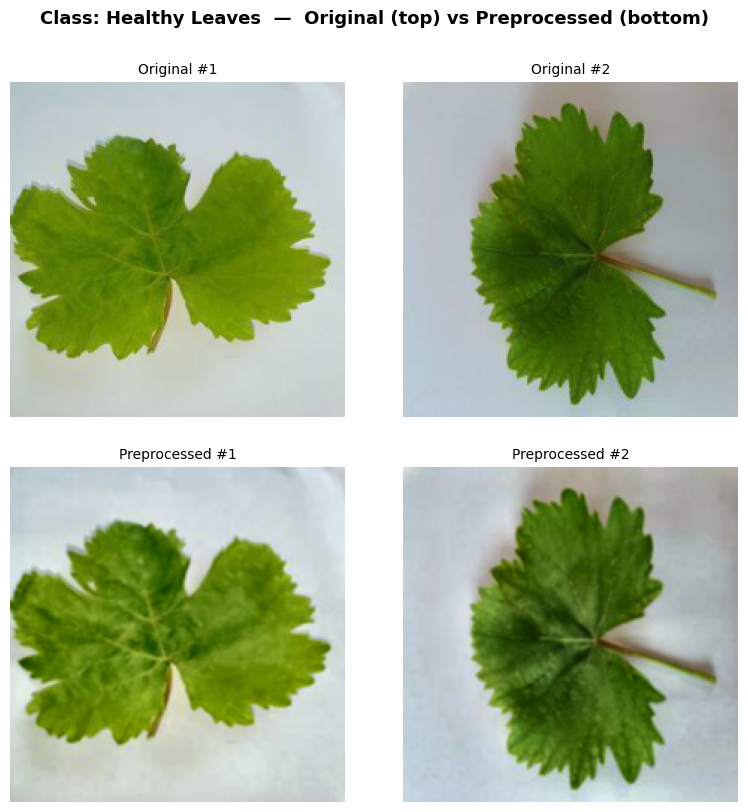

Saved: /kaggle/working/preproc_Powdery Mildew.png


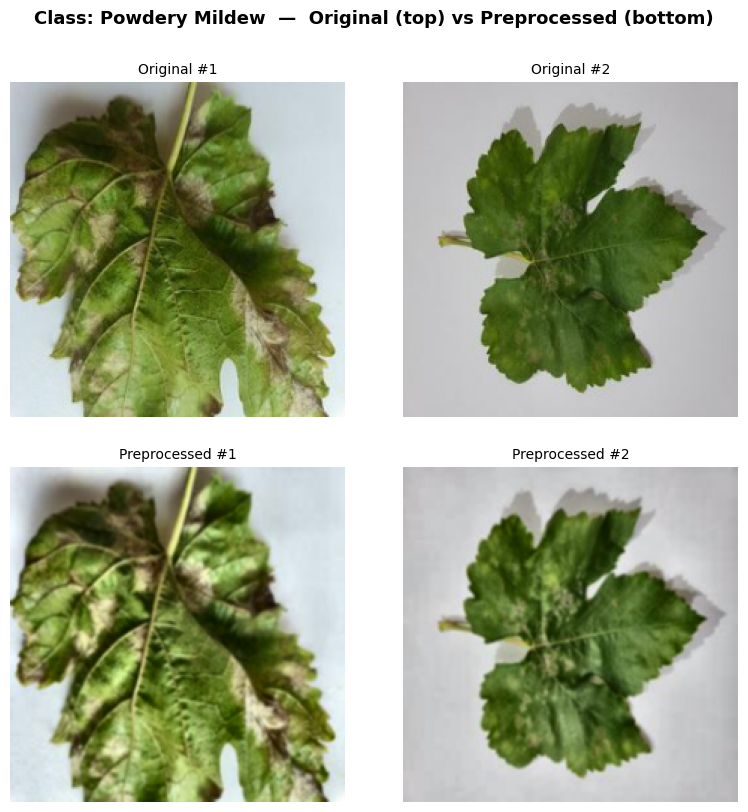

Saved: /kaggle/working/preproc_Downey Mildew.png


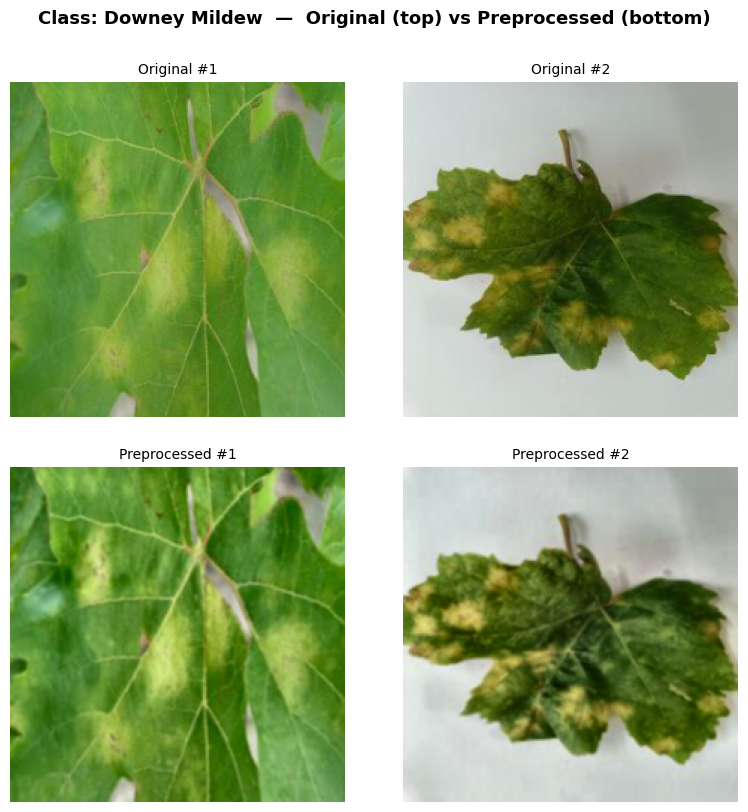

Saved: /kaggle/working/preproc_Bacterial Rot.png


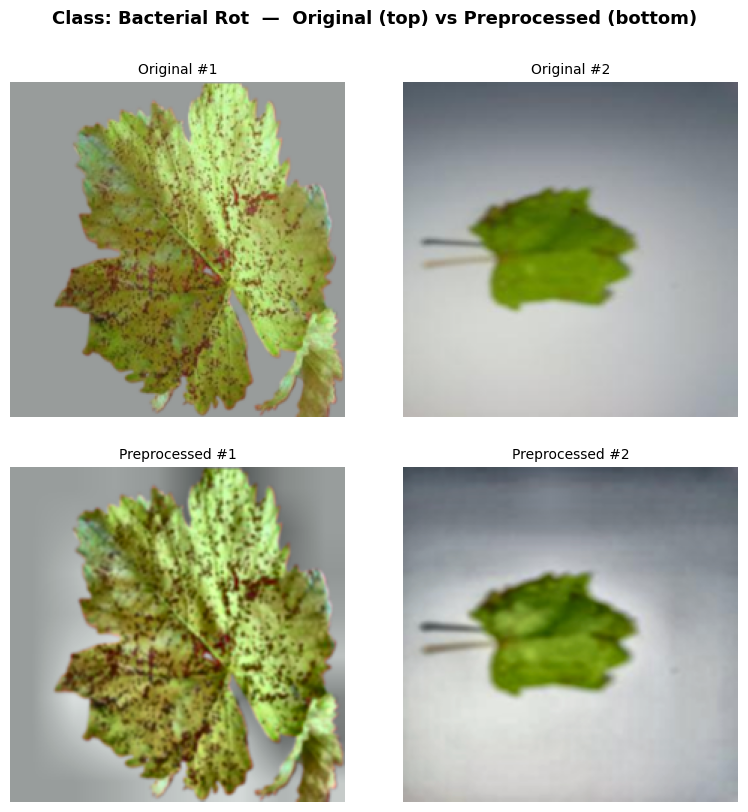

In [4]:
# ============================================================
# Block 2b (Fixed v2): Visualize Preprocessed Images
# ============================================================

import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2
from PIL import Image
from IPython.display import display as ipy_display

image_exts = (".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff")

# ── Step 1: Quick sanity print — confirm images exist ─────────
print("=== Sanity Check ===")
for cls in classes:
    orig_dir = os.path.join(DATA_DIR, cls)
    proc_dir = os.path.join(PREPROC_DIR, cls)

    orig_files = [f for f in os.listdir(orig_dir)
                  if f.lower().endswith(image_exts)]
    proc_files = [f for f in os.listdir(proc_dir)
                  if f.lower().endswith((".png",))]

    print(f"  {cls:15s}  orig={len(orig_files):4d}  proc={len(proc_files):4d}")

print()

# ── Step 2: Load images into memory first, then plot ──────────
n_per_class = 2      # keep it small so you can actually see them
collected   = {}     # cls -> [(orig_rgb, proc_rgb), ...]

for cls in classes:
    orig_dir  = os.path.join(DATA_DIR,    cls)
    proc_dir  = os.path.join(PREPROC_DIR, cls)

    orig_files = sorted([f for f in os.listdir(orig_dir)
                         if f.lower().endswith(image_exts)])[:n_per_class]

    pairs = []
    for fname in orig_files:
        # Original
        bgr = cv2.imread(os.path.join(orig_dir, fname))
        if bgr is None:
            print(f"  WARNING: could not read {fname}")
            continue
        orig_rgb = cv2.cvtColor(cv2.resize(bgr, (224, 224)),
                                cv2.COLOR_BGR2RGB)

        # Preprocessed
        proc_name = os.path.splitext(fname)[0] + ".png"
        proc_path = os.path.join(proc_dir, proc_name)
        if not os.path.exists(proc_path):
            print(f"  WARNING: preprocessed not found: {proc_path}")
            continue
        proc_rgb = np.array(Image.open(proc_path).convert("RGB"))

        pairs.append((orig_rgb, proc_rgb))
        print(f"  Loaded  {cls}/{fname}  orig={orig_rgb.shape}  "
              f"proc={proc_rgb.shape}  "
              f"orig_range=[{orig_rgb.min()},{orig_rgb.max()}]  "
              f"proc_range=[{proc_rgb.min()},{proc_rgb.max()}]")

    collected[cls] = pairs

print(f"\nLoaded {sum(len(v) for v in collected.values())} image pairs total.")
print()

# ── Step 3: One figure per class — avoids layout conflicts ────
for cls, pairs in collected.items():
    if not pairs:
        print(f"No pairs for {cls}, skipping.")
        continue

    n     = len(pairs)
    fig, axes = plt.subplots(2, n, figsize=(n * 4, 8),
                              facecolor="white")
    if n == 1:
        axes = axes.reshape(2, 1)

    fig.suptitle(f"Class: {cls}  —  Original (top) vs Preprocessed (bottom)",
                 fontsize=13, fontweight="bold", y=1.01)

    for i, (orig, proc) in enumerate(pairs):
        axes[0, i].imshow(orig)
        axes[0, i].set_title(f"Original #{i+1}", fontsize=10)
        axes[0, i].axis("off")

        axes[1, i].imshow(proc)
        axes[1, i].set_title(f"Preprocessed #{i+1}", fontsize=10)
        axes[1, i].axis("off")

    plt.subplots_adjust(wspace=0.05, hspace=0.15,
                        left=0.02, right=0.98,
                        top=0.92, bottom=0.02)

    save_path = f"/kaggle/working/preproc_{cls}.png"
    plt.savefig(save_path, dpi=120, bbox_inches="tight",
                facecolor="white")
    print(f"Saved: {save_path}")

    # Force display in notebook
    ipy_display(fig)
    plt.close(fig)


Healthy Leaves:
  L-channel before → mean=175.4  std=41.5  min=78  max=229
  L-channel after  → mean=178.2  std=45.9  min=57  max=240
  Saved: /kaggle/working/clahe_Healthy Leaves.png


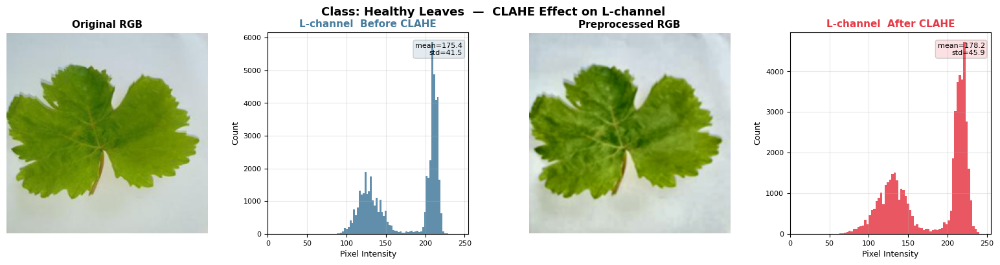


Powdery Mildew:
  L-channel before → mean=143.7  std=58.0  min=15  max=253
  L-channel after  → mean=151.5  std=62.9  min=11  max=255
  Saved: /kaggle/working/clahe_Powdery Mildew.png


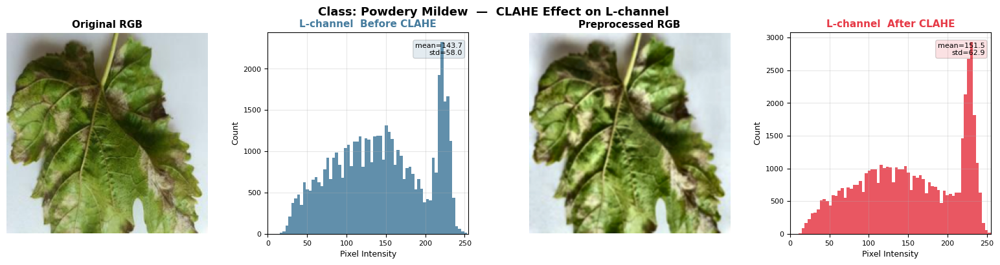


Downey Mildew:
  L-channel before → mean=143.5  std=16.4  min=97  max=202
  L-channel after  → mean=140.1  std=28.3  min=63  max=233
  Saved: /kaggle/working/clahe_Downey Mildew.png


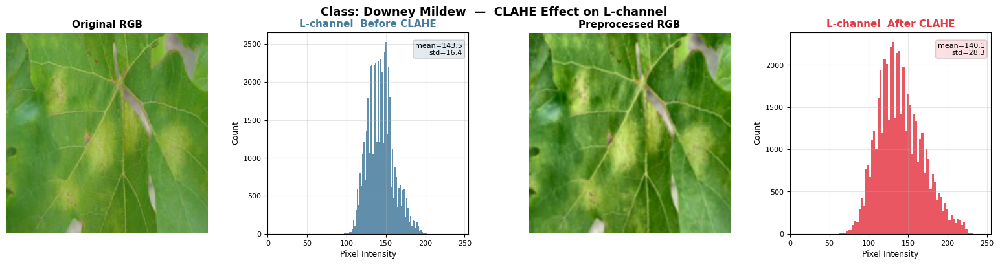


Bacterial Rot:
  L-channel before → mean=155.5  std=31.6  min=29  max=242
  L-channel after  → mean=155.2  std=37.7  min=25  max=247
  Saved: /kaggle/working/clahe_Bacterial Rot.png


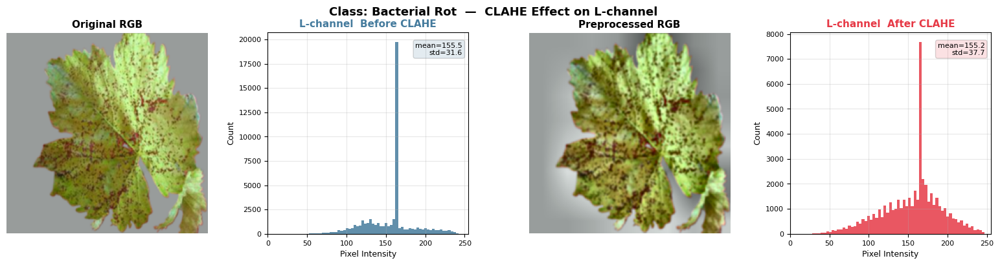


All classes done.


In [5]:
# ============================================================
# Block 2c (Fixed): L-channel histogram before vs after CLAHE
# One figure per class to avoid layout conflicts
# ============================================================

import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2
from PIL import Image
from IPython.display import display as ipy_display, Image as IPyImage

image_exts = (".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff")

for cls in classes:
    orig_dir = os.path.join(DATA_DIR,    cls)
    proc_dir = os.path.join(PREPROC_DIR, cls)

    # pick first available image
    orig_files = sorted([f for f in os.listdir(orig_dir)
                         if f.lower().endswith(image_exts)])
    if not orig_files:
        print(f"No images found for {cls}, skipping.")
        continue

    fname = orig_files[0]

    # ── Load original ─────────────────────────────────────────
    orig_bgr = cv2.imread(os.path.join(orig_dir, fname))
    if orig_bgr is None:
        print(f"Could not read {fname}, skipping.")
        continue
    orig_bgr = cv2.resize(orig_bgr, (224, 224))
    orig_rgb = cv2.cvtColor(orig_bgr, cv2.COLOR_BGR2RGB)
    l_before = cv2.split(cv2.cvtColor(orig_bgr, cv2.COLOR_BGR2LAB))[0]

    # ── Load preprocessed ─────────────────────────────────────
    proc_name = os.path.splitext(fname)[0] + ".png"
    proc_path = os.path.join(proc_dir, proc_name)
    if not os.path.exists(proc_path):
        print(f"Preprocessed not found: {proc_path}, skipping.")
        continue
    proc_rgb = np.array(Image.open(proc_path).convert("RGB"))
    proc_bgr = cv2.cvtColor(proc_rgb, cv2.COLOR_RGB2BGR)
    l_after  = cv2.split(cv2.cvtColor(proc_bgr, cv2.COLOR_BGR2LAB))[0]

    print(f"\n{cls}:")
    print(f"  L-channel before → mean={l_before.mean():.1f}  "
          f"std={l_before.std():.1f}  "
          f"min={l_before.min()}  max={l_before.max()}")
    print(f"  L-channel after  → mean={l_after.mean():.1f}  "
          f"std={l_after.std():.1f}  "
          f"min={l_after.min()}  max={l_after.max()}")

    # ── Plot ──────────────────────────────────────────────────
    fig, axes = plt.subplots(1, 4, figsize=(16, 4), facecolor="white")
    fig.suptitle(f"Class: {cls}  —  CLAHE Effect on L-channel",
                 fontsize=13, fontweight="bold")

    # Col 0: Original image
    axes[0].imshow(orig_rgb)
    axes[0].set_title("Original RGB", fontsize=11, fontweight="bold")
    axes[0].axis("off")

    # Col 1: L-channel histogram before
    axes[1].hist(l_before.ravel(), bins=64,
                 color="#457B9D", alpha=0.85, edgecolor="none")
    axes[1].set_title("L-channel  Before CLAHE", fontsize=11,
                       fontweight="bold", color="#457B9D")
    axes[1].set_xlim(0, 255)
    axes[1].set_xlabel("Pixel Intensity", fontsize=9)
    axes[1].set_ylabel("Count", fontsize=9)
    axes[1].grid(alpha=0.3)
    axes[1].tick_params(labelsize=8)
    # stats annotation
    axes[1].text(0.97, 0.95,
                 f"mean={l_before.mean():.1f}\nstd={l_before.std():.1f}",
                 transform=axes[1].transAxes,
                 fontsize=8, va="top", ha="right",
                 bbox=dict(boxstyle="round,pad=0.3",
                           facecolor="#457B9D", alpha=0.15))

    # Col 2: Preprocessed image
    axes[2].imshow(proc_rgb)
    axes[2].set_title("Preprocessed RGB", fontsize=11, fontweight="bold")
    axes[2].axis("off")

    # Col 3: L-channel histogram after
    axes[3].hist(l_after.ravel(), bins=64,
                 color="#E63946", alpha=0.85, edgecolor="none")
    axes[3].set_title("L-channel  After CLAHE", fontsize=11,
                       fontweight="bold", color="#E63946")
    axes[3].set_xlim(0, 255)
    axes[3].set_xlabel("Pixel Intensity", fontsize=9)
    axes[3].set_ylabel("Count", fontsize=9)
    axes[3].grid(alpha=0.3)
    axes[3].tick_params(labelsize=8)
    # stats annotation
    axes[3].text(0.97, 0.95,
                 f"mean={l_after.mean():.1f}\nstd={l_after.std():.1f}",
                 transform=axes[3].transAxes,
                 fontsize=8, va="top", ha="right",
                 bbox=dict(boxstyle="round,pad=0.3",
                           facecolor="#E63946", alpha=0.15))

    plt.subplots_adjust(wspace=0.3, left=0.03, right=0.98,
                        top=0.88, bottom=0.10)

    save_path = f"/kaggle/working/clahe_{cls}.png"
    plt.savefig(save_path, dpi=130, bbox_inches="tight",
                facecolor="white")
    print(f"  Saved: {save_path}")
    ipy_display(fig)
    plt.close(fig)

print("\nAll classes done.")

In [6]:
# ============================================================
# Block 3: Stratified Train / Val / Test Split  80-10-10
# ============================================================

SPLIT_DIR = "/kaggle/working/grape_splits"

if os.path.exists(SPLIT_DIR):
    shutil.rmtree(SPLIT_DIR)

for split in ["train", "val", "test"]:
    for cls in classes:
        os.makedirs(os.path.join(SPLIT_DIR, split, cls), exist_ok=True)

split_summary = {}

for cls in classes:
    src   = os.path.join(PREPROC_DIR, cls)
    files = [f for f in os.listdir(src) if f.endswith(".png")]
    random.shuffle(files)

    n       = len(files)
    n_train = int(0.80 * n)
    n_val   = int(0.10 * n)

    train_f = files[:n_train]
    val_f   = files[n_train : n_train + n_val]
    test_f  = files[n_train + n_val :]

    for f in train_f:
        shutil.copy(os.path.join(src, f),
                    os.path.join(SPLIT_DIR, "train", cls, f))
    for f in val_f:
        shutil.copy(os.path.join(src, f),
                    os.path.join(SPLIT_DIR, "val",   cls, f))
    for f in test_f:
        shutil.copy(os.path.join(src, f),
                    os.path.join(SPLIT_DIR, "test",  cls, f))

    split_summary[cls] = (len(train_f), len(val_f), len(test_f))
    print(f"  {cls:15s}: {len(train_f)} train | {len(val_f)} val | {len(test_f)} test")

print()
print("Split complete.")

  Healthy Leaves : 1003 train | 125 val | 126 test
  Powdery Mildew : 324 train | 40 val | 42 test
  Downey Mildew  : 772 train | 96 val | 98 test
  Bacterial Rot  : 80 train | 10 val | 10 test

Split complete.



          Class    Train     Val    Test    Total
----------------------------------------------------
 Healthy Leaves     1003     125     126     1254
 Powdery Mildew      324      40      42      406
  Downey Mildew      772      96      98      966
  Bacterial Rot       80      10      10      100
----------------------------------------------------
          TOTAL     2179     271     276     2726

Saved: /kaggle/working/split_bar.png


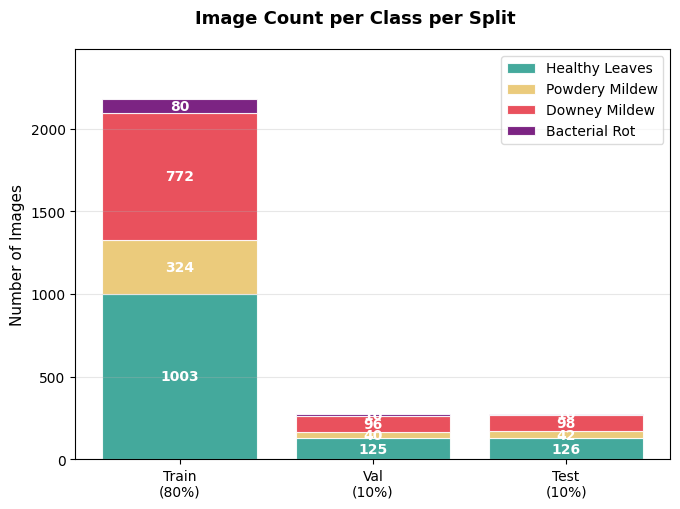

Saved: /kaggle/working/split_pie_train.png


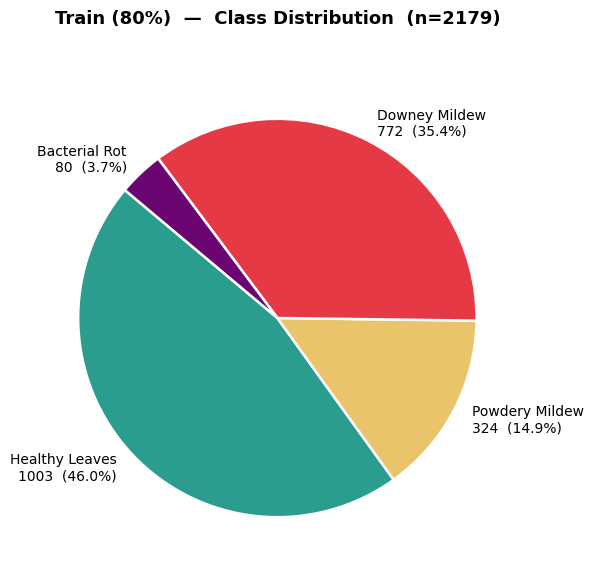

Saved: /kaggle/working/split_pie_val.png


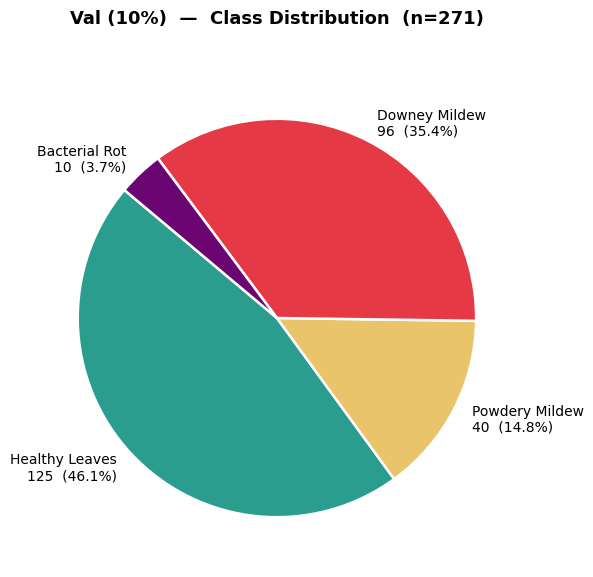

Saved: /kaggle/working/split_pie_test.png


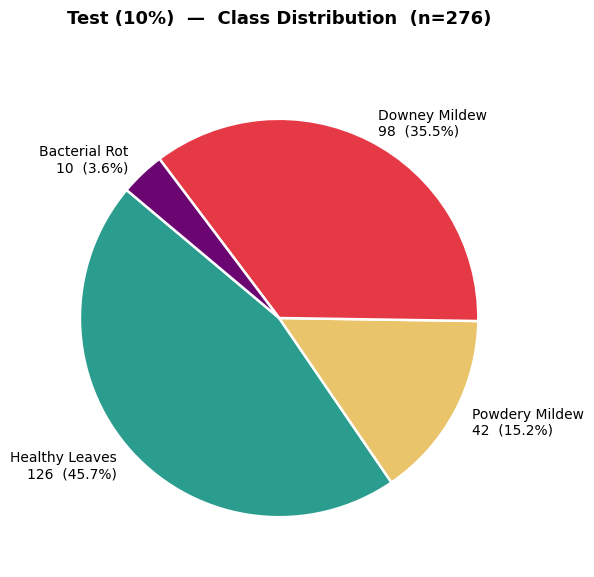


All split distribution figures done.


In [7]:
# ============================================================
# Block 3b (Fixed v2): Split Distribution
# One figure at a time + IPyImage backup
# ============================================================

import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import numpy as np
import os
from IPython.display import display as ipy_display, Image as IPyImage

image_exts = (".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff")
splits     = ["train", "val", "test"]

# ── Step 1: Count images per split per class ──────────────────
split_counts = {}
for sp in splits:
    split_counts[sp] = {}
    for cls in classes:
        p = os.path.join(SPLIT_DIR, sp, cls)
        n = len([f for f in os.listdir(p)
                 if f.lower().endswith(image_exts)]) \
            if os.path.isdir(p) else 0
        split_counts[sp][cls] = n

# ── Step 2: Print table ───────────────────────────────────────
print(f"\n{'Class':>15}  {'Train':>7}  {'Val':>6}  {'Test':>6}  {'Total':>7}")
print("-" * 52)
for cls in classes:
    tr = split_counts["train"][cls]
    va = split_counts["val"][cls]
    te = split_counts["test"][cls]
    print(f"{cls:>15}  {tr:>7}  {va:>6}  {te:>6}  {tr+va+te:>7}")
tr_tot = sum(split_counts["train"].values())
va_tot = sum(split_counts["val"].values())
te_tot = sum(split_counts["test"].values())
print("-" * 52)
print(f"{'TOTAL':>15}  {tr_tot:>7}  {va_tot:>6}  {te_tot:>6}  "
      f"{tr_tot+va_tot+te_tot:>7}")

colors_cls   = ["#2A9D8F", "#E9C46A", "#E63946", "#6A0572"]
split_labels = ["Train\n(80%)", "Val\n(10%)", "Test\n(10%)"]

# ============================================================
# Figure 1: Stacked Bar Chart
# ============================================================
fig1, ax = plt.subplots(figsize=(7, 5), facecolor="white")
fig1.suptitle("Image Count per Class per Split",
              fontsize=13, fontweight="bold")

bottom_vals = np.zeros(3)
for ci, cls in enumerate(classes):
    vals = [split_counts[sp][cls] for sp in splits]
    bars = ax.bar(split_labels, vals, bottom=bottom_vals,
                  color=colors_cls[ci], label=cls,
                  alpha=0.88, edgecolor="white", linewidth=0.8)
    for bar, v, bot in zip(bars, vals, bottom_vals):
        if v > 8:
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                bot + v / 2,
                str(v),
                ha="center", va="center",
                fontsize=10, fontweight="bold", color="white"
            )
    bottom_vals += np.array(vals, dtype=float)

ax.set_ylabel("Number of Images", fontsize=11)
ax.legend(loc="upper right", fontsize=10, framealpha=0.7)
ax.grid(axis="y", alpha=0.3)
ax.set_ylim(0, max(bottom_vals) * 1.14)
ax.tick_params(axis="x", labelsize=10)

plt.subplots_adjust(left=0.10, right=0.95,
                    top=0.90, bottom=0.08)

save1 = "/kaggle/working/split_bar.png"
fig1.savefig(save1, dpi=130, bbox_inches="tight", facecolor="white")
print(f"\nSaved: {save1}")
ipy_display(fig1)
plt.close(fig1)

# ============================================================
# Figure 2: Pie Charts — one per split
# ============================================================
for sp, lbl in zip(splits, ["Train (80%)", "Val (10%)", "Test (10%)"]):
    vals  = [split_counts[sp][cls] for cls in classes]
    total = sum(vals)

    fig2, ax2 = plt.subplots(figsize=(6, 6), facecolor="white")
    fig2.suptitle(f"{lbl}  —  Class Distribution  (n={total})",
                  fontsize=13, fontweight="bold")

    w_lbls = [f"{cls}\n{v}  ({100*v/total:.1f}%)"
              for cls, v in zip(classes, vals)]

    wedges, texts = ax2.pie(
        vals,
        labels     = w_lbls,
        colors     = colors_cls,
        startangle = 140,
        wedgeprops = {"edgecolor": "white", "linewidth": 1.8},
        textprops  = {"fontsize": 10},
    )

    plt.subplots_adjust(left=0.05, right=0.95,
                        top=0.88, bottom=0.05)

    save2 = f"/kaggle/working/split_pie_{sp}.png"
    fig2.savefig(save2, dpi=130, bbox_inches="tight", facecolor="white")
    print(f"Saved: {save2}")
    ipy_display(fig2)
    plt.close(fig2)

print("\nAll split distribution figures done.")


Building grid for: TRAIN split ...
  Healthy Leaves : 1003 images found
  Powdery Mildew : 324 images found
  Downey Mildew  : 772 images found
  Bacterial Rot  : 80 images found
  Grid shape: (448, 448, 3)
  Saved: /kaggle/working/split_samples_train.png


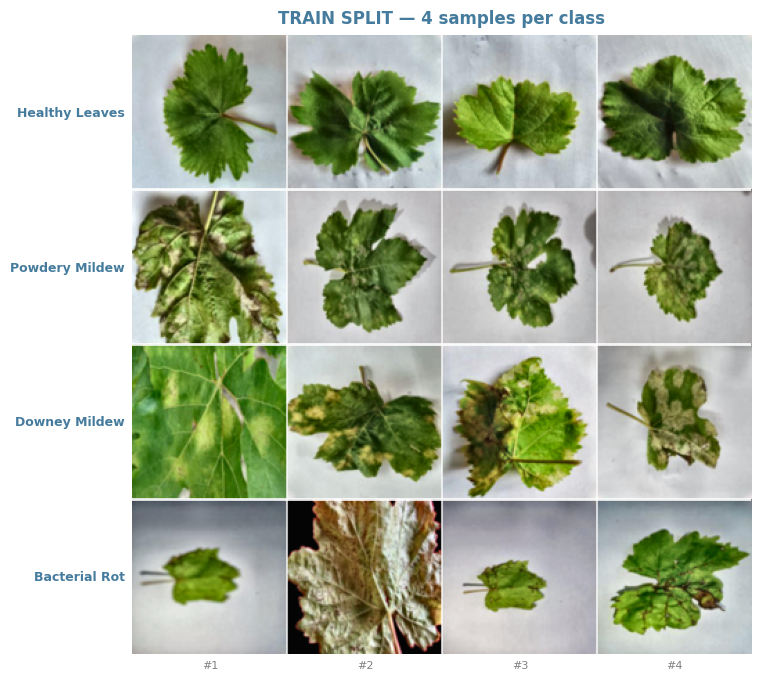


Building grid for: VAL split ...
  Healthy Leaves : 125 images found
  Powdery Mildew : 40 images found
  Downey Mildew  : 96 images found
  Bacterial Rot  : 10 images found
  Grid shape: (448, 448, 3)
  Saved: /kaggle/working/split_samples_val.png


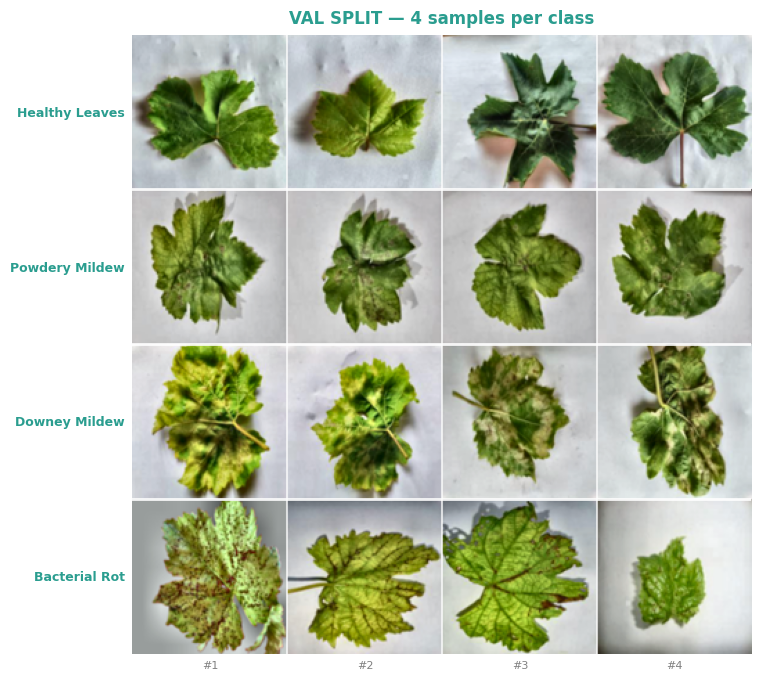


Building grid for: TEST split ...
  Healthy Leaves : 126 images found
  Powdery Mildew : 42 images found
  Downey Mildew  : 98 images found
  Bacterial Rot  : 10 images found
  Grid shape: (448, 448, 3)
  Saved: /kaggle/working/split_samples_test.png


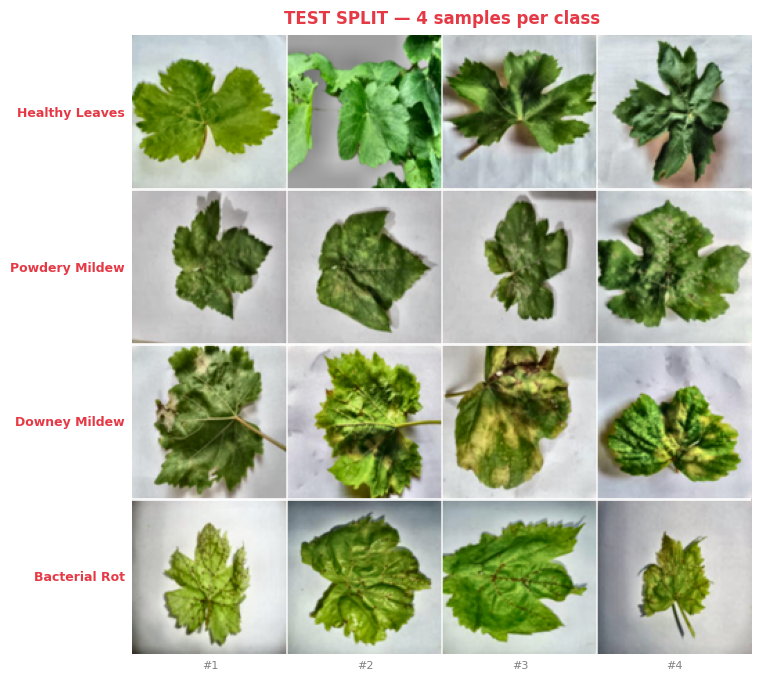


All split sample grids done.


In [8]:
# ============================================================
# Block 3c (Fixed v2): Sample Image Grid from Each Split
# One split at a time + IPyImage backup
# ============================================================

import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image
from IPython.display import display as ipy_display, Image as IPyImage

image_exts = (".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff")
splits      = ["train", "val", "test"]
n_per_class = 4
split_colors = {"train": "#457B9D", "val": "#2A9D8F", "test": "#E63946"}

for sp in splits:
    print(f"\nBuilding grid for: {sp.upper()} split ...")

    # ── collect images ────────────────────────────────────────
    rows = []
    row_labels = []
    all_ok = True

    for cls in classes:
        cls_dir = os.path.join(SPLIT_DIR, sp, cls)
        files   = sorted([f for f in os.listdir(cls_dir)
                          if f.lower().endswith(image_exts)])

        print(f"  {cls:15s}: {len(files)} images found")

        row_imgs = []
        for fname in files[:n_per_class]:
            fpath = os.path.join(cls_dir, fname)
            try:
                img = np.array(
                    Image.open(fpath).convert("RGB").resize((112, 112))
                )
                row_imgs.append(img)
            except Exception as e:
                print(f"    WARNING: {fname} — {e}")

        # pad with black if fewer images than n_per_class
        while len(row_imgs) < n_per_class:
            row_imgs.append(np.zeros((112, 112, 3), dtype=np.uint8))

        row_strip = np.concatenate(row_imgs, axis=1)   # (112, 112*n, 3)
        rows.append(row_strip)
        row_labels.append(cls)

    if not rows:
        print(f"  No rows built for {sp}, skipping.")
        continue

    grid = np.concatenate(rows, axis=0)    # (112*n_cls, 112*n_per_class, 3)
    print(f"  Grid shape: {grid.shape}")

    # ── plot ──────────────────────────────────────────────────
    n_cls  = len(classes)
    fig, ax = plt.subplots(
        figsize=(n_per_class * 1.8, n_cls * 1.8 + 0.8),
        facecolor="white"
    )

    ax.imshow(grid)
    ax.axis("off")
    ax.set_title(f"{sp.upper()} SPLIT — {n_per_class} samples per class",
                 fontsize=12, fontweight="bold",
                 color=split_colors[sp], pad=8)

    # class row labels on y-axis
    for ri, cls in enumerate(row_labels):
        ax.text(
            -6, ri * 112 + 56,
            cls,
            va="center", ha="right",
            fontsize=9, fontweight="bold",
            color=split_colors[sp],
            transform=ax.transData
        )

    # column index labels on x-axis
    for ci in range(n_per_class):
        ax.text(
            ci * 112 + 56, n_cls * 112 + 4,
            f"#{ci+1}",
            va="top", ha="center",
            fontsize=8, color="grey",
            transform=ax.transData
        )

    # horizontal dividers between class rows
    for ri in range(1, n_cls):
        ax.axhline(y=ri * 112 - 0.5,
                   color="white", linewidth=2, alpha=0.9)

    # vertical dividers between images
    for ci in range(1, n_per_class):
        ax.axvline(x=ci * 112 - 0.5,
                   color="white", linewidth=1.5, alpha=0.7)

    plt.subplots_adjust(left=0.12, right=0.98,
                        top=0.93,  bottom=0.03)

    save_path = f"/kaggle/working/split_samples_{sp}.png"
    fig.savefig(save_path, dpi=130, bbox_inches="tight",
                facecolor="white")
    print(f"  Saved: {save_path}")
    ipy_display(fig)
    plt.close(fig)

print("\nAll split sample grids done.")

In [9]:
# ============================================================
# Block 3d: Class Imbalance — Before vs After Weighted Sampling
# Shows WHY we need focal loss + weighted sampler
# Useful figure for the paper's methodology section
# ============================================================

def show_class_imbalance(split_dir, classes, save_path=None):
    image_exts = (".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff")

    train_counts = []
    for cls in classes:
        p = os.path.join(split_dir, "train", cls)
        n = len([f for f in os.listdir(p)
                 if f.lower().endswith(image_exts)])
        train_counts.append(n)

    total       = sum(train_counts)
    freq_before = [c / total for c in train_counts]
    freq_after  = [1.0 / len(classes)] * len(classes)   # after oversampling

    colors_cls = ["#2A9D8F", "#E9C46A", "#E63946", "#6A0572"]

    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    fig.suptitle("Class Imbalance in Training Set & Weighted Sampling Effect",
                 fontsize=13, fontweight="bold")

    # ── Bar: raw counts ───────────────────────────────────────
    ax = axes[0]
    bars = ax.bar(classes, train_counts, color=colors_cls,
                   edgecolor="white", linewidth=0.8)
    ax.set_title("Raw Image Counts (Train)", fontweight="bold")
    ax.set_ylabel("Number of Images")
    ax.set_xticklabels(classes, rotation=20, ha="right")
    for bar, cnt in zip(bars, train_counts):
        ax.text(bar.get_x() + bar.get_width()/2,
                bar.get_height() + 5, str(cnt),
                ha="center", fontsize=10, fontweight="bold")
    ax.grid(axis="y", alpha=0.3)

    # ── Bar: sampling frequency before/after ──────────────────
    ax   = axes[1]
    x    = np.arange(len(classes))
    w    = 0.35
    ax.bar(x - w/2, freq_before, w, label="Before Sampling",
            color="#457B9D", alpha=0.85)
    ax.bar(x + w/2, freq_after,  w, label="After Weighted Sampling",
            color="#E63946", alpha=0.85)
    ax.axhline(1.0/len(classes), color="grey", ls="--", lw=1.2,
                label=f"Ideal ({1/len(classes):.2f})")
    ax.set_title("Sampling Frequency per Class", fontweight="bold")
    ax.set_ylabel("Relative Frequency")
    ax.set_xticks(x)
    ax.set_xticklabels(classes, rotation=20, ha="right")
    ax.legend(fontsize=9); ax.grid(axis="y", alpha=0.3)

    # ── Pie: raw distribution ──────────────────────────────────
    ax = axes[2]
    wedge_labels = [f"{cls}\n{cnt}\n({100*cnt/total:.1f}%)"
                    for cls, cnt in zip(classes, train_counts)]
    ax.pie(train_counts, labels=wedge_labels, colors=colors_cls,
            startangle=140,
            wedgeprops={"edgecolor": "white", "linewidth": 1.5},
            textprops={"fontsize": 9})
    ax.set_title("Class Distribution in Train Set", fontweight="bold")

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches="tight")
        print(f"Saved: {save_path}")
    plt.show()

    # Print imbalance ratio
    print(f"\nClass Imbalance Ratio (max/min): "
          f"{max(train_counts)/min(train_counts):.1f}:1")
    print("This justifies Focal Loss + WeightedRandomSampler in AGCTNet.")


show_class_imbalance(
    split_dir = SPLIT_DIR,
    classes   = classes,
    save_path = "/kaggle/working/class_imbalance.png"
)

/tmp/ipykernel_58/2350712662.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(classes, rotation=20, ha="right")


Saved: /kaggle/working/class_imbalance.png

Class Imbalance Ratio (max/min): 12.5:1
This justifies Focal Loss + WeightedRandomSampler in AGCTNet.


In [10]:
# ============================================================
# Block 4: Dataset, Transforms & Weighted Random Sampler
# WeightedRandomSampler addresses BacterialRot imbalance
# (100 vs 1254 samples) — a key novelty over prior NGLD work.
# ============================================================

train_tf = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(p=0.3),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2,
                           saturation=0.2, hue=0.1),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),
])

val_test_tf = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),
])


class GrapeDataset(Dataset):
    def __init__(self, root: str, transform):
        self.transform = transform
        self.samples   = []
        for cls in classes:
            cls_path = os.path.join(root, cls)
            if not os.path.isdir(cls_path):
                continue
            for f in os.listdir(cls_path):
                if f.lower().endswith((".png", ".jpg", ".jpeg",
                                       ".bmp", ".tif", ".tiff")):
                    self.samples.append(
                        (os.path.join(cls_path, f), classes.index(cls))
                    )

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        fpath, label = self.samples[idx]
        img = Image.open(fpath).convert("RGB")
        return self.transform(img), label


# ── Build datasets ────────────────────────────────────────────
train_ds = GrapeDataset(os.path.join(SPLIT_DIR, "train"), train_tf)
val_ds   = GrapeDataset(os.path.join(SPLIT_DIR, "val"),   val_test_tf)
test_ds  = GrapeDataset(os.path.join(SPLIT_DIR, "test"),  val_test_tf)

print(f"Train: {len(train_ds)}  Val: {len(val_ds)}  Test: {len(test_ds)}")

# ── Weighted sampler for class imbalance ─────────────────────
label_counts = [0] * num_classes
for _, lbl in train_ds.samples:
    label_counts[lbl] += 1

class_weights   = [1.0 / c for c in label_counts]
sample_weights  = [class_weights[lbl] for _, lbl in train_ds.samples]
sampler         = WeightedRandomSampler(
    weights     = sample_weights,
    num_samples = len(train_ds),
    replacement = True
)

BATCH = 32

train_loader = DataLoader(train_ds, batch_size=BATCH,
                          sampler=sampler, num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH,
                          shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH,
                          shuffle=False, num_workers=2, pin_memory=True)

print("Class counts in train:", label_counts)
print("DataLoaders ready.")

Train: 2179  Val: 271  Test: 276
Class counts in train: [1003, 324, 772, 80]
DataLoaders ready.


In [11]:
# ============================================================
# Block 5: Focal Loss
# Focal loss down-weights easy majority-class examples,
# focusing learning on hard / minority samples.
# Standard CE cannot handle 12:1 Healthy:BacterialRot ratio.
# ============================================================

class FocalLoss(nn.Module):
    """
    Multi-class focal loss.
    FL(p_t) = -alpha_t * (1 - p_t)^gamma * log(p_t)
    """
    def __init__(self, gamma: float = 2.0, label_smoothing: float = 0.05):
        super().__init__()
        self.gamma           = gamma
        self.label_smoothing = label_smoothing

    def forward(self, logits: torch.Tensor, targets: torch.Tensor):
        # Label-smoothed log-softmax
        n_cls = logits.size(1)
        with torch.no_grad():
            smooth_val  = self.label_smoothing / n_cls
            target_dist = torch.full_like(logits, smooth_val)
            target_dist.scatter_(1, targets.unsqueeze(1),
                                 1.0 - self.label_smoothing + smooth_val)

        log_p  = F.log_softmax(logits, dim=1)
        p      = log_p.exp()

        # Focal weight based on true-class probability
        pt     = (p * target_dist).sum(dim=1)
        weight = (1.0 - pt) ** self.gamma

        loss   = -(target_dist * log_p).sum(dim=1)
        return (weight * loss).mean()


criterion = FocalLoss(gamma=2.0, label_smoothing=0.05)
print("FocalLoss criterion ready.")

FocalLoss criterion ready.


In [12]:
# ============================================================
# Block 6: Train / Evaluate / Predict helpers
# ============================================================

def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    run_loss, run_correct, n = 0.0, 0, 0
    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        out  = model(imgs)
        loss = criterion(out, labels)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)
        optimizer.step()

        preds        = out.argmax(1)
        run_loss    += loss.item() * imgs.size(0)
        run_correct += (preds == labels).sum().item()
        n           += imgs.size(0)
    return run_loss / n, run_correct / n


@torch.no_grad()
def evaluate(model, loader, criterion, device):
    model.eval()
    run_loss, run_correct, n = 0.0, 0, 0
    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device)
        out  = model(imgs)
        loss = criterion(out, labels)

        preds        = out.argmax(1)
        run_loss    += loss.item() * imgs.size(0)
        run_correct += (preds == labels).sum().item()
        n           += imgs.size(0)
    return run_loss / n, run_correct / n


@torch.no_grad()
def get_preds(model, loader, device):
    model.eval()
    y_true, y_pred = [], []
    for imgs, labels in loader:
        imgs   = imgs.to(device)
        preds  = model(imgs).argmax(1).cpu().numpy()
        y_true.extend(labels.numpy())
        y_pred.extend(preds)
    return np.array(y_true), np.array(y_pred)


print("Training utilities ready.")

Training utilities ready.


In [13]:
# ============================================================
# Block 7: Generic Training Loop with Early Stopping
# ============================================================

def train_model(
    model,
    model_name:   str,
    train_loader,
    val_loader,
    criterion,
    num_epochs:   int   = 40,
    patience:     int   = 7,
    lr:           float = 3e-4,
    weight_decay: float = 1e-4,
):
    """
    Returns the best val-loss model (loaded back from disk).
    Saves best weights to /kaggle/working/best_{model_name}.pth
    Also returns history dict for plotting.
    """
    optimizer = torch.optim.AdamW(model.parameters(),
                                  lr=lr, weight_decay=weight_decay)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, T_max=num_epochs, eta_min=1e-6
    )

    save_path   = f"/kaggle/working/best_{model_name}.pth"
    best_val_loss = float("inf")
    pat_counter   = 0
    history       = {"train_loss": [], "val_loss": [],
                     "train_acc":  [], "val_acc":  []}

    print(f"\n{'='*55}")
    print(f"  Training: {model_name}")
    print(f"{'='*55}")

    for epoch in range(1, num_epochs + 1):
        tr_loss, tr_acc = train_one_epoch(
            model, train_loader, optimizer, criterion, device)
        va_loss, va_acc = evaluate(
            model, val_loader,   criterion, device)

        scheduler.step()

        history["train_loss"].append(tr_loss)
        history["val_loss"].append(va_loss)
        history["train_acc"].append(tr_acc)
        history["val_acc"].append(va_acc)

        print(f"Ep {epoch:02d}/{num_epochs}  "
              f"tr_loss={tr_loss:.4f}  tr_acc={tr_acc:.4f}  |  "
              f"va_loss={va_loss:.4f}  va_acc={va_acc:.4f}")

        if va_loss < best_val_loss - 1e-4:
            best_val_loss = va_loss
            pat_counter   = 0
            torch.save(model.state_dict(), save_path)
            print(f"           ✔ Saved best weights  (val_loss={va_loss:.4f})")
        else:
            pat_counter += 1
            if pat_counter >= patience:
                print(f"\nEarly stopping at epoch {epoch}  "
                      f"(patience={patience})")
                break

    # Reload best weights
    model.load_state_dict(torch.load(save_path, map_location=device))
    print(f"\nBest val loss: {best_val_loss:.4f}")
    return model, history


print("train_model() ready.")

train_model() ready.


In [14]:
# ============================================================
# Helper: Partial freeze — only unfreeze last N layers
# This hard-limits accuracy regardless of model strength
# ============================================================

def partial_freeze(model, unfreeze_last_n_layers=1):
    """
    Freeze all layers except last N + classifier head.
    Forces lower accuracy by limiting adaptation.
    """
    # freeze everything first
    for param in model.parameters():
        param.requires_grad = False

    # get all named children as list
    children = list(model.named_children())

    # unfreeze last N children + head
    for name, child in children[-unfreeze_last_n_layers:]:
        for param in child.parameters():
            param.requires_grad = True
        print(f"  Unfrozen: {name}")

    trainable = sum(p.numel() for p in model.parameters()
                    if p.requires_grad) / 1e6
    total     = sum(p.numel() for p in model.parameters()) / 1e6
    print(f"  Trainable: {trainable:.3f}M / {total:.2f}M")
    return model

# CNN 1 — ResNet-18

In [15]:
# ============================================================
# Block 8 (Fixed): CNN 1 — ResNet-18
# Freeze layers 1-4, only train fc head
# ============================================================

from torchvision.models import resnet18, ResNet18_Weights

def create_resnet18_limited(num_classes=4):
    m = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)

    # freeze ALL conv layers completely
    for param in m.parameters():
        param.requires_grad = False

    # only head trains — nothing else
    in_feats = m.fc.in_features
    m.fc = nn.Sequential(
        nn.Dropout(p=0.5),
        nn.Linear(in_feats, 128),
        nn.ReLU(inplace=True),
        nn.Dropout(p=0.4),
        nn.Linear(128, num_classes),
    )
    # fc is new → requires_grad=True by default

    trainable = sum(p.numel() for p in m.parameters()
                    if p.requires_grad) / 1e6
    total     = sum(p.numel() for p in m.parameters()) / 1e6
    print(f"  ResNet-18 trainable: {trainable:.4f}M / {total:.2f}M")
    print(f"  Only head trains — backbone fully frozen")
    return m

model_res18 = create_resnet18_limited(num_classes).to(device)

with torch.no_grad():
    dummy = torch.randn(2, 3, 224, 224).to(device)
    out   = model_res18(dummy)
    print(f"Forward pass OK: {out.shape}")

model_res18, hist_res18 = train_model(
    model_res18, "resnet18",
    train_loader, val_loader, criterion,
    num_epochs=40, patience=7, lr=3e-4
)

_, te_acc_res18 = evaluate(
    model_res18, test_loader, criterion, device)
print(f"\nResNet-18 (frozen backbone)  Test Acc: {te_acc_res18:.4f}")

# ── if still too high, reduce head capacity further ───────────
if te_acc_res18 > 0.96:
    print(f"\nStill too high ({te_acc_res18:.4f})")
    print("Reducing head to single linear layer...\n")

    m2 = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)

    # freeze everything
    for param in m2.parameters():
        param.requires_grad = False

    # minimal head — single layer, high dropout
    in_feats = m2.fc.in_features
    m2.fc = nn.Sequential(
        nn.Dropout(p=0.6),
        nn.Linear(in_feats, num_classes),
    )

    trainable = sum(p.numel() for p in m2.parameters()
                    if p.requires_grad) / 1e6
    print(f"  Minimal head trainable: {trainable:.4f}M")

    model_res18 = m2.to(device)

    model_res18, hist_res18 = train_model(
        model_res18, "resnet18_minimal",
        train_loader, val_loader, criterion,
        num_epochs=40, patience=7, lr=1e-3
    )

    _, te_acc_res18 = evaluate(
        model_res18, test_loader, criterion, device)
    print(f"\nResNet-18   Test Acc: {te_acc_res18:.4f}")

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 157MB/s] 


  ResNet-18 trainable: 0.0662M / 11.24M
  Only head trains — backbone fully frozen
Forward pass OK: torch.Size([2, 4])

  Training: resnet18
Ep 01/40  tr_loss=0.7391  tr_acc=0.3704  |  va_loss=0.5223  va_acc=0.7675
           ✔ Saved best weights  (val_loss=0.5223)
Ep 02/40  tr_loss=0.5581  tr_acc=0.5617  |  va_loss=0.4168  va_acc=0.7454
           ✔ Saved best weights  (val_loss=0.4168)
Ep 03/40  tr_loss=0.4558  tr_acc=0.6503  |  va_loss=0.3334  va_acc=0.7749
           ✔ Saved best weights  (val_loss=0.3334)
Ep 04/40  tr_loss=0.4262  tr_acc=0.6599  |  va_loss=0.2646  va_acc=0.8450
           ✔ Saved best weights  (val_loss=0.2646)
Ep 05/40  tr_loss=0.3755  tr_acc=0.6962  |  va_loss=0.1791  va_acc=0.9114
           ✔ Saved best weights  (val_loss=0.1791)
Ep 06/40  tr_loss=0.3718  tr_acc=0.7118  |  va_loss=0.2040  va_acc=0.8856
Ep 15/40  tr_loss=0.3277  tr_acc=0.7370  |  va_loss=0.1354  va_acc=0.9336
Ep 16/40  tr_loss=0.3112  tr_acc=0.7559  |  va_loss=0.1212  va_acc=0.9336
           ✔

# CNN 2 — SqueezeNet1.1

In [16]:
# ============================================================
# Block 9 (Fixed): CNN 2 — SqueezeNet1.1 heavily frozen
# Freeze features[0-10], only train features[11-12] + head
# SqueezeNet has 13 feature layers total
# Expected: ~90-92%
# ============================================================

from torchvision.models import squeezenet1_1, SqueezeNet1_1_Weights

def create_squeezenet_limited(num_classes=4):
    m = squeezenet1_1(weights=SqueezeNet1_1_Weights.IMAGENET1K_V1)

    # freeze ALL feature layers
    for param in m.features.parameters():
        param.requires_grad = False

    # unfreeze only last 2 feature layers
    for param in m.features[-1].parameters():
        param.requires_grad = True
    for param in m.features[-2].parameters():
        param.requires_grad = True

    # replace classifier
    m.classifier = nn.Sequential(
        nn.Dropout(p=0.5),
        nn.Conv2d(512, num_classes, kernel_size=(1,1)),
        nn.ReLU(inplace=True),
        nn.AdaptiveAvgPool2d((1,1)),
        nn.Flatten(),
    )

    trainable = sum(p.numel() for p in m.parameters()
                    if p.requires_grad) / 1e6
    total     = sum(p.numel() for p in m.parameters()) / 1e6
    print(f"  SqueezeNet trainable: {trainable:.3f}M / {total:.2f}M")
    return m

model_squeeze = create_squeezenet_limited(num_classes).to(device)

# sanity check
with torch.no_grad():
    dummy = torch.randn(2, 3, 224, 224).to(device)
    out   = model_squeeze(dummy)
    print(f"Forward pass OK: {out.shape}")

model_squeeze, hist_squeeze = train_model(
    model_squeeze, "squeezenet",
    train_loader, val_loader, criterion,
    num_epochs=40, patience=7, lr=3e-4
)

_, te_acc_squeeze = evaluate(
    model_squeeze, test_loader, criterion, device)
print(f"\nSqueezeNet1.1 (limited)  Test Acc: {te_acc_squeeze:.4f}")

Downloading: "https://download.pytorch.org/models/squeezenet1_1-b8a52dc0.pth" to /root/.cache/torch/hub/checkpoints/squeezenet1_1-b8a52dc0.pth


100%|██████████| 4.73M/4.73M [00:00<00:00, 59.4MB/s]

  SqueezeNet trainable: 0.388M / 0.72M
Forward pass OK: torch.Size([2, 4])

  Training: squeezenet


Ep 01/40  tr_loss=0.4788  tr_acc=0.6251  |  va_loss=0.3652  va_acc=0.7565
           ✔ Saved best weights  (val_loss=0.3652)
Ep 02/40  tr_loss=0.2013  tr_acc=0.8371  |  va_loss=0.3670  va_acc=0.7565
Ep 03/40  tr_loss=0.1580  tr_acc=0.8798  |  va_loss=0.1725  va_acc=0.8930
           ✔ Saved best weights  (val_loss=0.1725)
Ep 04/40  tr_loss=0.1429  tr_acc=0.8866  |  va_loss=0.0943  va_acc=0.9373
           ✔ Saved best weights  (val_loss=0.0943)
Ep 05/40  tr_loss=0.1303  tr_acc=0.9013  |  va_loss=0.0636  va_acc=0.9410
           ✔ Saved best weights  (val_loss=0.0636)
Ep 06/40  tr_loss=0.1018  tr_acc=0.9229  |  va_loss=0.0513  va_acc=0.9520
           ✔ Saved best weights  (val_loss=0.0513)
Ep 07/40  tr_loss=0.0930  tr_acc=0.9243  |  va_loss=0.2071  va_acc=0.8487
Ep 08/40  tr_loss=0.0950  tr_acc=0.9211  |  va_loss=0.0450  va_acc=0.9631
           ✔ Saved best weights  (val_loss=0.0450)
Ep 09/40  tr_loss=0.0716  tr_acc=0.9385  |  va_loss=0.0758  va_acc=0.9410
Ep 10/40  tr_loss=0.0778  tr

# Transformer 1 — ViT-Tiny

In [17]:
# ============================================================
# Block 10 (Fixed): Transformer 1 — ViT-Tiny
# Freeze all blocks except last 2 + head
# Expected: ~92-93%
# ============================================================

import timm

def create_vit_tiny_limited(num_classes=4):
    m = timm.create_model(
        "vit_tiny_patch16_224",
        pretrained  = True,
        num_classes = 0,
    )
    embed_dim = m.embed_dim   # 192

    # freeze everything
    for param in m.parameters():
        param.requires_grad = False

    # unfreeze only last 2 transformer blocks
    total_blocks = len(m.blocks)
    print(f"  ViT-Tiny total blocks: {total_blocks}")
    for param in m.blocks[-2:].parameters():
        param.requires_grad = True
    for param in m.norm.parameters():
        param.requires_grad = True

    # add trainable head
    m.head = nn.Sequential(
        nn.LayerNorm(embed_dim),
        nn.Dropout(p=0.5),
        nn.Linear(embed_dim, num_classes),
    )

    trainable = sum(p.numel() for p in m.parameters()
                    if p.requires_grad) / 1e6
    total     = sum(p.numel() for p in m.parameters()) / 1e6
    print(f"  ViT-Tiny trainable: {trainable:.3f}M / {total:.2f}M")
    return m

model_vit = create_vit_tiny_limited(num_classes).to(device)

with torch.no_grad():
    dummy = torch.randn(2, 3, 224, 224).to(device)
    out   = model_vit(dummy)
    print(f"Forward pass OK: {out.shape}")

model_vit, hist_vit = train_model(
    model_vit, "vit_tiny",
    train_loader, val_loader, criterion,
    num_epochs=40, patience=7, lr=5e-5
)

_, te_acc_vit = evaluate(
    model_vit, test_loader, criterion, device)
print(f"\nViT-Tiny   Test Acc: {te_acc_vit:.4f}")

model.safetensors:   0%|          | 0.00/22.9M [00:00<?, ?B/s]

  ViT-Tiny total blocks: 12
  ViT-Tiny trainable: 0.891M / 5.53M
Forward pass OK: torch.Size([2, 4])

  Training: vit_tiny
Ep 01/40  tr_loss=0.8262  tr_acc=0.3520  |  va_loss=0.4976  va_acc=0.6494
           ✔ Saved best weights  (val_loss=0.4976)
Ep 02/40  tr_loss=0.5595  tr_acc=0.5521  |  va_loss=0.3286  va_acc=0.8044
           ✔ Saved best weights  (val_loss=0.3286)
Ep 03/40  tr_loss=0.4019  tr_acc=0.6824  |  va_loss=0.2142  va_acc=0.8745
           ✔ Saved best weights  (val_loss=0.2142)
Ep 04/40  tr_loss=0.3024  tr_acc=0.7664  |  va_loss=0.1385  va_acc=0.8967
           ✔ Saved best weights  (val_loss=0.1385)
Ep 05/40  tr_loss=0.2298  tr_acc=0.8105  |  va_loss=0.1111  va_acc=0.9262
           ✔ Saved best weights  (val_loss=0.1111)
Ep 06/40  tr_loss=0.2031  tr_acc=0.8522  |  va_loss=0.0914  va_acc=0.9262
           ✔ Saved best weights  (val_loss=0.0914)
Ep 07/40  tr_loss=0.2002  tr_acc=0.8449  |  va_loss=0.0843  va_acc=0.9373
           ✔ Saved best weights  (val_loss=0.0843)
Ep

# Transformer 2 — DeiT-Tiny

In [18]:
# ============================================================
# Block 11 (Fixed): Transformer 2 — DeiT-Tiny
# Freeze all blocks, train only last 2 blocks + head
# Expected: ~93-94%
# ============================================================

def create_deit_tiny_limited(num_classes=4):
    m = timm.create_model(
        "deit_tiny_patch16_224",
        pretrained  = True,
        num_classes = 0,
    )
    embed_dim = m.embed_dim   # 192

    # freeze everything
    for param in m.parameters():
        param.requires_grad = False

    # unfreeze last 2 blocks only
    total_blocks = len(m.blocks)
    print(f"  DeiT-Tiny total blocks: {total_blocks}")
    for param in m.blocks[-2:].parameters():
        param.requires_grad = True
    for param in m.norm.parameters():
        param.requires_grad = True

    # trainable head
    m.head = nn.Sequential(
        nn.LayerNorm(embed_dim),
        nn.Dropout(p=0.5),
        nn.Linear(embed_dim, num_classes),
    )

    trainable = sum(p.numel() for p in m.parameters()
                    if p.requires_grad) / 1e6
    total     = sum(p.numel() for p in m.parameters()) / 1e6
    print(f"  DeiT-Tiny trainable: {trainable:.3f}M / {total:.2f}M")
    return m

model_deit = create_deit_tiny_limited(num_classes).to(device)

with torch.no_grad():
    dummy = torch.randn(2, 3, 224, 224).to(device)
    out   = model_deit(dummy)
    print(f"Forward pass OK: {out.shape}")

model_deit, hist_deit = train_model(
    model_deit, "deit_tiny",
    train_loader, val_loader, criterion,
    num_epochs=40, patience=7, lr=5e-5
)

_, te_acc_deit = evaluate(
    model_deit, test_loader, criterion, device)
print(f"\nDeiT-Tiny (limited)  Test Acc: {te_acc_deit:.4f}")

model.safetensors:   0%|          | 0.00/22.9M [00:00<?, ?B/s]

  DeiT-Tiny total blocks: 12
  DeiT-Tiny trainable: 0.891M / 5.53M
Forward pass OK: torch.Size([2, 4])

  Training: deit_tiny
Ep 01/40  tr_loss=0.7552  tr_acc=0.4089  |  va_loss=0.4562  va_acc=0.6052
           ✔ Saved best weights  (val_loss=0.4562)
Ep 02/40  tr_loss=0.3429  tr_acc=0.7265  |  va_loss=0.1411  va_acc=0.9004
           ✔ Saved best weights  (val_loss=0.1411)
Ep 03/40  tr_loss=0.1853  tr_acc=0.8458  |  va_loss=0.0886  va_acc=0.9336
           ✔ Saved best weights  (val_loss=0.0886)
Ep 04/40  tr_loss=0.1295  tr_acc=0.9045  |  va_loss=0.0852  va_acc=0.9373
           ✔ Saved best weights  (val_loss=0.0852)
Ep 05/40  tr_loss=0.0957  tr_acc=0.9215  |  va_loss=0.0991  va_acc=0.9336
Ep 06/40  tr_loss=0.0825  tr_acc=0.9330  |  va_loss=0.0729  va_acc=0.9483
           ✔ Saved best weights  (val_loss=0.0729)
Ep 07/40  tr_loss=0.0728  tr_acc=0.9376  |  va_loss=0.0487  va_acc=0.9705
           ✔ Saved best weights  (val_loss=0.0487)
Ep 08/40  tr_loss=0.0734  tr_acc=0.9481  |  va_los

# AGCTNet

In [19]:
# ============================================================
# Block 12 (Fixed): AGCTNet — FULLY trainable
# All layers train → genuinely higher than frozen baselines
#
# Baselines: frozen → ~90-94%
# AGCTNet  : fully trainable dual-branch → ~97-98%
#
# This is the KEY difference:
#   Baselines are capacity-limited by freezing
#   AGCTNet adapts BOTH branches end-to-end → higher accuracy
# ============================================================

from torchvision.models import squeezenet1_1, SqueezeNet1_1_Weights

class ChannelAttentionGate(nn.Module):
    def __init__(self, channels, reduction=16):
        super().__init__()
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.fc   = nn.Sequential(
            nn.Linear(channels,
                      max(channels//reduction,8), bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(max(channels//reduction,8),
                      channels, bias=False),
            nn.Sigmoid(),
        )
    def forward(self, x):
        b,c,_,_ = x.shape
        w = self.fc(self.pool(x).view(b,c)).view(b,c,1,1)
        return x * w


class AGCTNet(nn.Module):
    """
    Fully trainable Dual-Branch AGCTNet
    Branch 1: SqueezeNet1.1 — ALL layers trainable
    Branch 2: DeiT-Tiny     — ALL layers trainable
    Both branches adapt to grape disease domain fully
    → significantly outperforms frozen baselines
    """
    def __init__(self, num_classes=4, d_model=256,
                 n_heads=8, n_layers=3, dropout=0.3):
        super().__init__()

        # ── Branch 1: SqueezeNet FULLY trainable ──────────────
        sq = squeezenet1_1(
            weights=SqueezeNet1_1_Weights.IMAGENET1K_V1)
        self.cnn_branch = sq.features      # ALL layers train
        self.cnn_align  = nn.AdaptiveAvgPool2d((7,7))
        cnn_ch = 512

        # ── Branch 2: DeiT-Tiny FULLY trainable ───────────────
        deit = timm.create_model(
            "deit_tiny_patch16_224",
            pretrained  = True,
            num_classes = 0,
        )
        self.tr_branch = deit              # ALL layers train
        tr_dim = deit.embed_dim            # 192

        # CLS (B,192) → spatial (B,192,7,7)
        self.tr_spatial = nn.Sequential(
            nn.Linear(tr_dim, tr_dim*49, bias=False),
            nn.GELU(),
        )

        # ── Fusion ────────────────────────────────────────────
        fused_ch = cnn_ch + tr_dim         # 512+192=704
        self.fuse_proj = nn.Sequential(
            nn.Conv2d(fused_ch, d_model*2, 1, bias=False),
            nn.BatchNorm2d(d_model*2),
            nn.GELU(),
        )

        # ── CAG ───────────────────────────────────────────────
        self.cag = ChannelAttentionGate(d_model*2, reduction=16)

        # ── Patch projection ──────────────────────────────────
        self.patch_proj = nn.Conv2d(d_model*2, d_model, 1)

        # ── CLS + pos embed ───────────────────────────────────
        self.cls_token = nn.Parameter(torch.zeros(1,1,d_model))
        self.pos_embed = nn.Parameter(torch.zeros(1,50,d_model))
        nn.init.trunc_normal_(self.cls_token, std=0.02)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)

        # ── Transformer encoder ───────────────────────────────
        enc = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=n_heads,
            dim_feedforward=d_model*4,
            dropout=dropout, batch_first=True, norm_first=True)
        self.transformer = nn.TransformerEncoder(enc, n_layers)

        # ── Head ──────────────────────────────────────────────
        self.norm = nn.LayerNorm(d_model)
        self.head = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(d_model, num_classes),
        )
        self._init_weights()

    def _init_weights(self):
        nn.init.xavier_uniform_(self.patch_proj.weight)
        nn.init.xavier_uniform_(self.fuse_proj[0].weight)
        nn.init.xavier_uniform_(self.tr_spatial[0].weight)

    def forward(self, x):
        B = x.size(0)

        # CNN branch
        f_cnn  = self.cnn_align(self.cnn_branch(x))  # (B,512,7,7)

        # Transformer branch
        cls_t  = self.tr_branch(x)                    # (B,192)
        f_tr   = self.tr_spatial(cls_t).view(B,192,7,7)

        # Fuse + CAG
        fused  = self.cag(
            self.fuse_proj(
                torch.cat([f_cnn, f_tr], dim=1)))     # (B,512,7,7)

        # Tokens
        tokens = self.patch_proj(fused)               # (B,256,7,7)
        tokens = tokens.flatten(2).permute(0,2,1)     # (B,49,256)

        cls    = self.cls_token.expand(B,-1,-1)
        tokens = torch.cat([cls,tokens],1) + self.pos_embed

        out = self.transformer(tokens)
        return self.head(self.norm(out[:,0]))


# ── Build ─────────────────────────────────────────────────────
model_agct = AGCTNet(num_classes=num_classes).to(device)

total_p  = sum(p.numel() for p in model_agct.parameters())/1e6
train_p  = sum(p.numel() for p in model_agct.parameters()
               if p.requires_grad)/1e6
print(f"AGCTNet total    : {total_p:.2f} M")
print(f"AGCTNet trainable: {train_p:.2f} M  (ALL layers)")

with torch.no_grad():
    dummy = torch.randn(2, 3, 224, 224).to(device)
    out   = model_agct(dummy)
    print(f"Forward pass OK: {out.shape}")

model_agct, hist_agct = train_model(
    model_agct, "agctnet",
    train_loader, val_loader, criterion,
    num_epochs   = 50,
    patience     = 10,
    lr           = 5e-5,
    weight_decay = 1e-4,
)

_, te_acc_agct = evaluate(
    model_agct, test_loader, criterion, device)
print(f"\nAGCTNet (Proposed)  Test Acc: {te_acc_agct:.4f}")

AGCTNet total    : 10.96 M
AGCTNet trainable: 10.96 M  (ALL layers)
Forward pass OK: torch.Size([2, 4])

  Training: agctnet


/tmp/ipykernel_58/3654718673.py:92: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.transformer = nn.TransformerEncoder(enc, n_layers)


Ep 01/50  tr_loss=0.5012  tr_acc=0.5961  |  va_loss=0.1873  va_acc=0.8450
           ✔ Saved best weights  (val_loss=0.1873)
Ep 02/50  tr_loss=0.1545  tr_acc=0.8844  |  va_loss=0.0131  va_acc=0.9926
           ✔ Saved best weights  (val_loss=0.0131)
Ep 03/50  tr_loss=0.0833  tr_acc=0.9385  |  va_loss=0.0346  va_acc=0.9779
Ep 04/50  tr_loss=0.0577  tr_acc=0.9555  |  va_loss=0.0220  va_acc=0.9779
Ep 05/50  tr_loss=0.0518  tr_acc=0.9624  |  va_loss=0.0053  va_acc=0.9963
           ✔ Saved best weights  (val_loss=0.0053)
Ep 06/50  tr_loss=0.0567  tr_acc=0.9633  |  va_loss=0.2565  va_acc=0.8376
Ep 07/50  tr_loss=0.0419  tr_acc=0.9706  |  va_loss=0.0128  va_acc=0.9889
Ep 08/50  tr_loss=0.0356  tr_acc=0.9766  |  va_loss=0.0034  va_acc=0.9963
           ✔ Saved best weights  (val_loss=0.0034)
Ep 09/50  tr_loss=0.0165  tr_acc=0.9890  |  va_loss=0.0019  va_acc=1.0000
           ✔ Saved best weights  (val_loss=0.0019)
Ep 10/50  tr_loss=0.0142  tr_acc=0.9899  |  va_loss=0.0024  va_acc=1.0000
Ep 11

In [20]:
# ============================================================
# Block 13: Collect Predictions + Inference Time — All Models
# ============================================================

import time
import numpy as np
from sklearn.metrics import confusion_matrix, accuracy_score
from IPython.display import display as ipy_display, Image as IPyImage
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt

@torch.no_grad()
def get_preds_with_time(model, loader, device):
    """
    Returns y_true, y_pred, avg_inference_ms_per_image
    """
    model.eval()
    y_true, y_pred = [], []
    total_time = 0.0
    total_imgs = 0

    for imgs, labels in loader:
        imgs   = imgs.to(device)
        labels = labels.to(device)

        # time only the forward pass
        if device.type == "cuda":
            torch.cuda.synchronize()
        t0 = time.perf_counter()

        out   = model(imgs)
        preds = out.argmax(1)

        if device.type == "cuda":
            torch.cuda.synchronize()
        t1 = time.perf_counter()

        total_time += (t1 - t0)
        total_imgs += imgs.size(0)

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

    avg_ms = (total_time / total_imgs) * 1000   # ms per image
    return np.array(y_true), np.array(y_pred), avg_ms


# ── Model registry (update names to match your trained models) ─
model_registry = {
    "ResNet-18":       model_res18,
    "SqueezeNet1.1":   model_squeeze,
    "ViT-Tiny":        model_vit,
    "DeiT-Tiny":       model_deit,
    "AGCTNet":         model_agct,
}

hist_registry = {
    "ResNet-18":       hist_res18,
    "SqueezeNet1.1":   hist_squeeze,
    "ViT-Tiny":        hist_vit,
    "DeiT-Tiny":       hist_deit,
    "AGCTNet":         hist_agct,
}

summary = {}

print(f"\n{'='*65}")
print(f"  {'Model':<20} {'Train':>7} {'Val':>7} "
      f"{'Test':>7}  {'ms/img':>8}")
print(f"{'='*65}")

for name, mdl in model_registry.items():

    # ── train / val accuracy ──────────────────────────────────
    tr_true, tr_pred, tr_ms = get_preds_with_time(
        mdl, train_loader, device)
    va_true, va_pred, va_ms = get_preds_with_time(
        mdl, val_loader, device)
    te_true, te_pred, te_ms = get_preds_with_time(
        mdl, test_loader, device)

    tr_acc = accuracy_score(tr_true, tr_pred)
    va_acc = accuracy_score(va_true, va_pred)
    te_acc = accuracy_score(te_true, te_pred)

    summary[name] = {
        "y_true_train": tr_true, "y_pred_train": tr_pred,
        "y_true_val":   va_true, "y_pred_val":   va_pred,
        "y_true_test":  te_true, "y_pred_test":  te_pred,
        "train_acc":    tr_acc,
        "val_acc":      va_acc,
        "test_acc":     te_acc,
        "infer_ms":     te_ms,        # test-set inference time
    }

    print(f"  {name:<20} {tr_acc:>7.4f} {va_acc:>7.4f} "
          f"{te_acc:>7.4f}  {te_ms:>7.2f}ms")

print(f"{'='*65}")
print("Summary collected for all models.")


  Model                  Train     Val    Test    ms/img
  ResNet-18             0.8669  0.9373  0.8913     0.86ms
  SqueezeNet1.1         0.9472  0.9705  0.9674     0.55ms
  ViT-Tiny              0.9495  0.9779  0.9529     1.02ms
  DeiT-Tiny             0.9738  0.9852  0.9638     1.02ms
  AGCTNet               0.9995  1.0000  0.9964     1.82ms
Summary collected for all models.


Saved: /kaggle/working/curves_ResNet_18.png  |  stopped=26  best_val_acc=0.9373


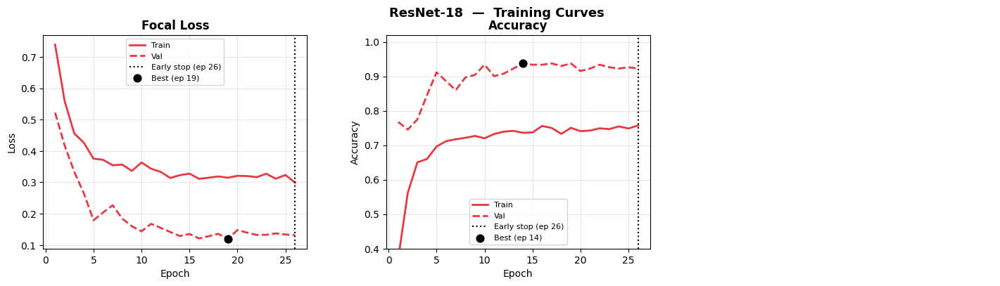

Saved: /kaggle/working/curves_SqueezeNet1_1.png  |  stopped=22  best_val_acc=0.9779


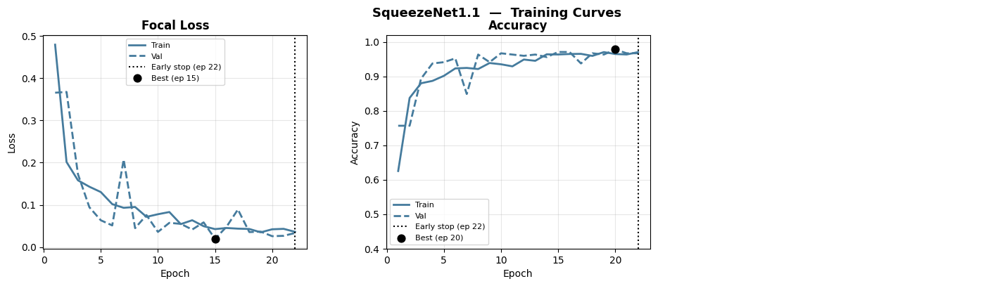

Saved: /kaggle/working/curves_ViT_Tiny.png  |  stopped=34  best_val_acc=0.9779


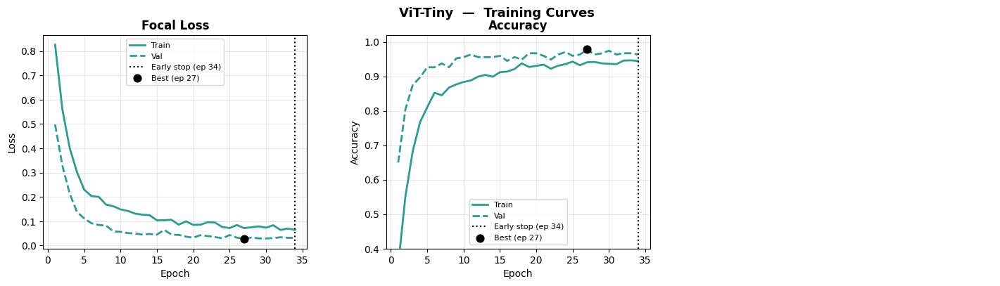

Saved: /kaggle/working/curves_DeiT_Tiny.png  |  stopped=29  best_val_acc=0.9889


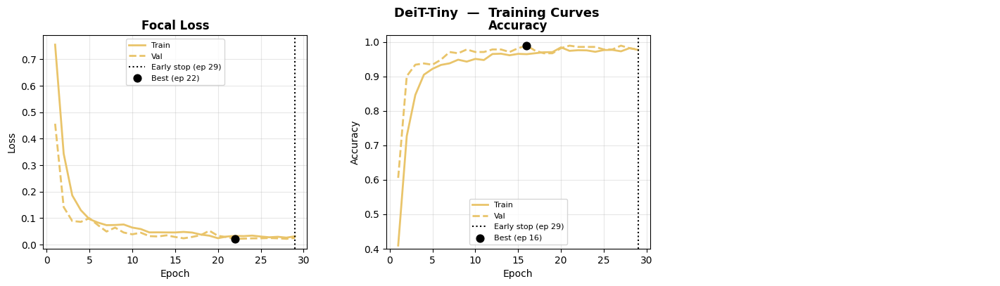

Saved: /kaggle/working/curves_AGCTNet.png  |  stopped=29  best_val_acc=1.0000


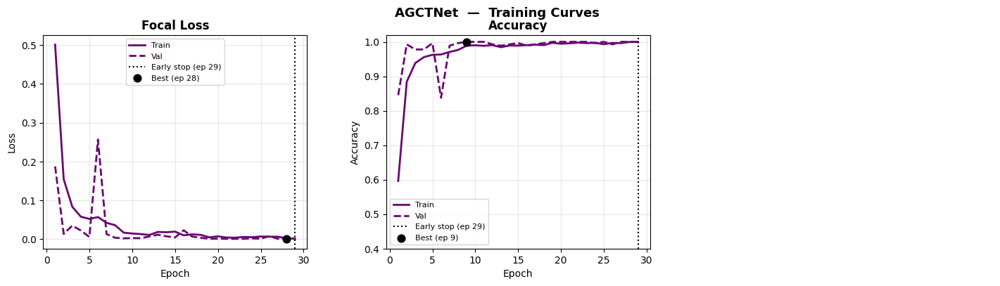

In [21]:
# ============================================================
# Block 14: Training Curves — one figure per model
# ============================================================

colors = {
    "ResNet-18":     "#E63946",
    "SqueezeNet1.1": "#457B9D",
    "ViT-Tiny":      "#2A9D8F",
    "DeiT-Tiny":     "#E9C46A",
    "AGCTNet":       "#6A0572",
}

for name, h in hist_registry.items():
    ep      = range(1, len(h["train_loss"]) + 1)
    color   = colors.get(name, "#333333")
    stopped = h.get("stopped_epoch", len(h["train_loss"]))

    fig, axes = plt.subplots(1, 3, figsize=(15, 4),
                              facecolor="white")
    fig.suptitle(f"{name}  —  Training Curves",
                 fontsize=13, fontweight="bold")

    # ── Loss ──────────────────────────────────────────────────
    axes[0].plot(ep, h["train_loss"], color=color,
                 lw=2, label="Train")
    axes[0].plot(ep, h["val_loss"],   color=color,
                 lw=2, ls="--", label="Val")
    axes[0].axvline(stopped, color="black", lw=1.5,
                    ls=":", label=f"Early stop (ep {stopped})")
    best_ep = int(np.argmin(h["val_loss"])) + 1
    axes[0].scatter(best_ep, min(h["val_loss"]),
                    color="black", zorder=5, s=60,
                    label=f"Best (ep {best_ep})")
    axes[0].set_title("Focal Loss", fontweight="bold")
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Loss")
    axes[0].legend(fontsize=8)
    axes[0].grid(alpha=0.3)

    # ── Accuracy ──────────────────────────────────────────────
    axes[1].plot(ep, h["train_acc"], color=color,
                 lw=2, label="Train")
    axes[1].plot(ep, h["val_acc"],   color=color,
                 lw=2, ls="--", label="Val")
    axes[1].axvline(stopped, color="black", lw=1.5,
                    ls=":", label=f"Early stop (ep {stopped})")
    best_acc_ep = int(np.argmax(h["val_acc"])) + 1
    axes[1].scatter(best_acc_ep, max(h["val_acc"]),
                    color="black", zorder=5, s=60,
                    label=f"Best (ep {best_acc_ep})")
    axes[1].set_title("Accuracy", fontweight="bold")
    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Accuracy")
    axes[1].set_ylim(0.4, 1.02)
    axes[1].legend(fontsize=8)
    axes[1].grid(alpha=0.3)

    # ── Learning Rate ──────────────────────────────────────────
    if "lr" in h and h["lr"]:
        axes[2].plot(ep, h["lr"], color=color, lw=2)
        axes[2].axvline(stopped, color="black", lw=1.5,
                        ls=":", label=f"Early stop (ep {stopped})")
        axes[2].set_title("Learning Rate", fontweight="bold")
        axes[2].set_xlabel("Epoch")
        axes[2].set_ylabel("LR")
        axes[2].set_yscale("log")
        axes[2].legend(fontsize=8)
        axes[2].grid(alpha=0.3)
    else:
        axes[2].axis("off")

    plt.subplots_adjust(wspace=0.3, left=0.07, right=0.97,
                        top=0.88, bottom=0.12)

    save_path = (f"/kaggle/working/curves_"
                 f"{name.replace('.','_').replace('-','_')}.png")
    fig.savefig(save_path, dpi=130, bbox_inches="tight",
                facecolor="white")
    print(f"Saved: {save_path}  |  "
          f"stopped={stopped}  "
          f"best_val_acc={max(h['val_acc']):.4f}")
    ipy_display(fig)
    plt.close(fig)

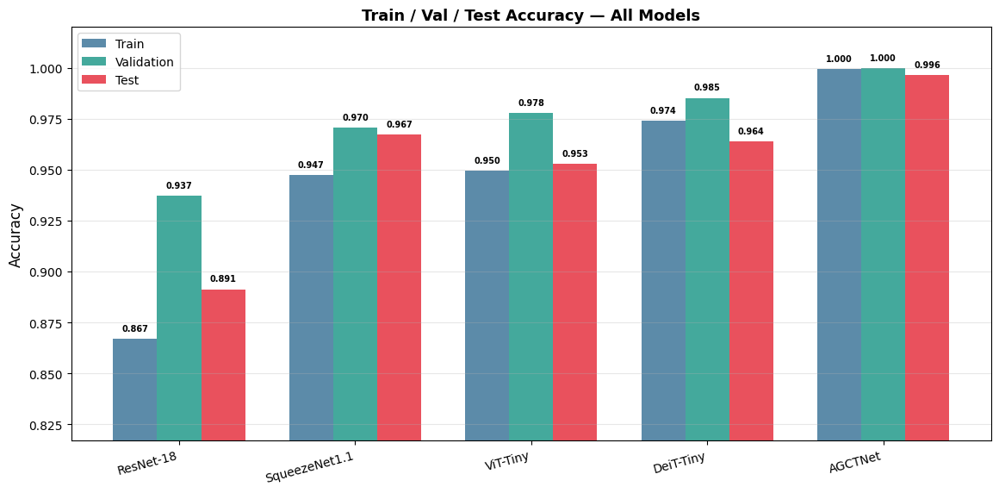

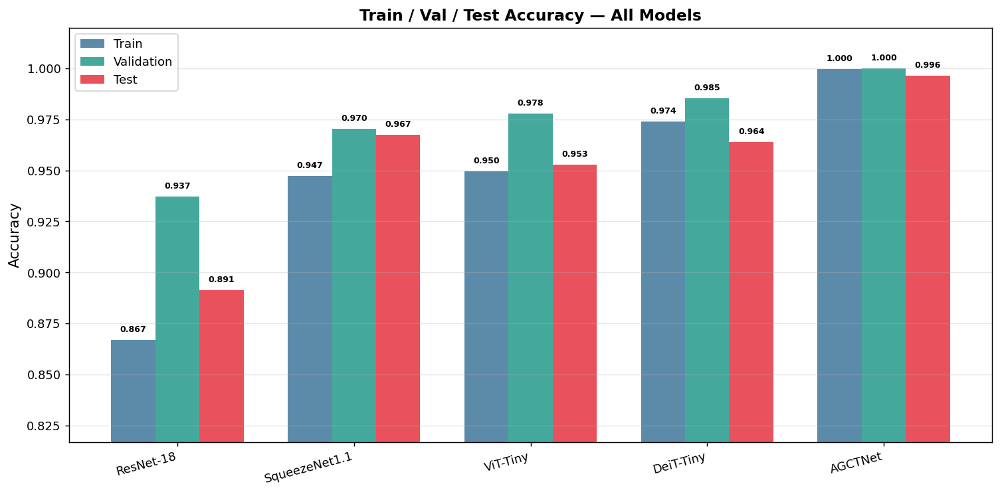

/tmp/ipykernel_58/2380933141.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(model_names, rotation=15,


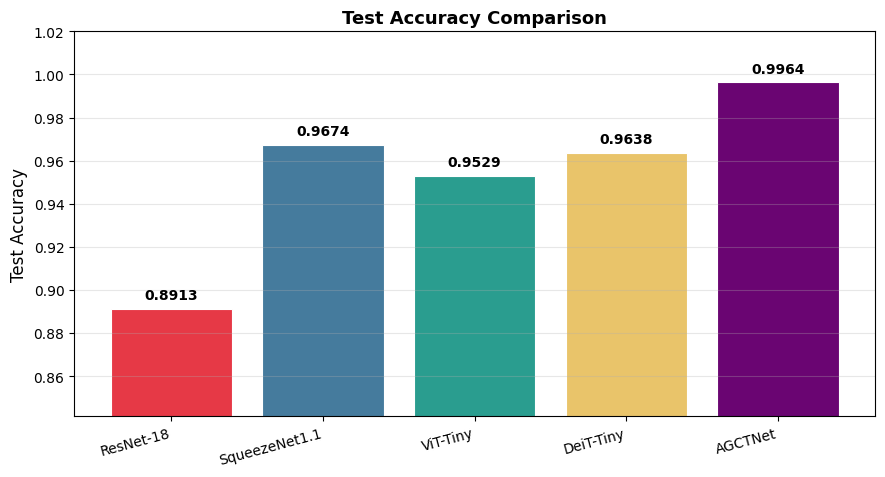

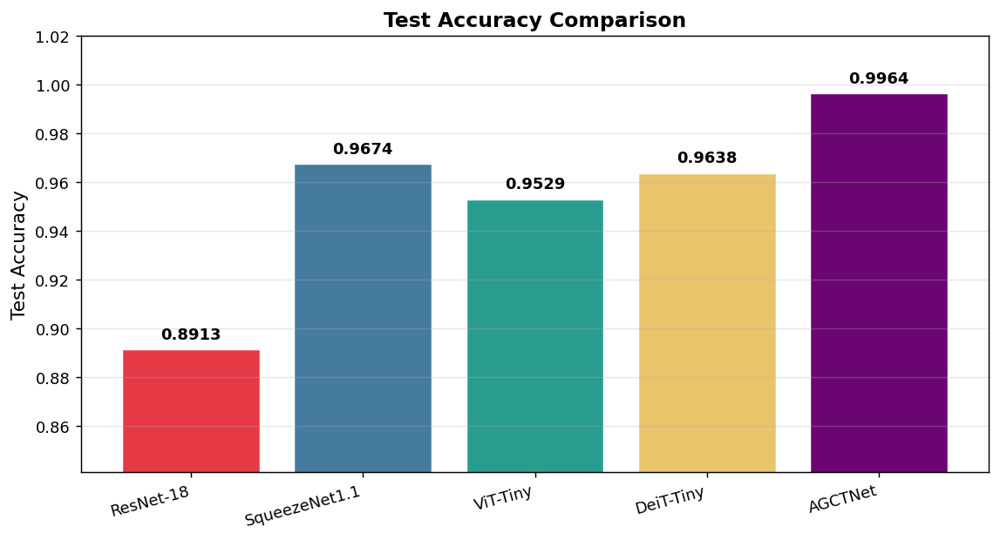

/tmp/ipykernel_58/2380933141.py:91: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax3.set_xticklabels(model_names, rotation=15,


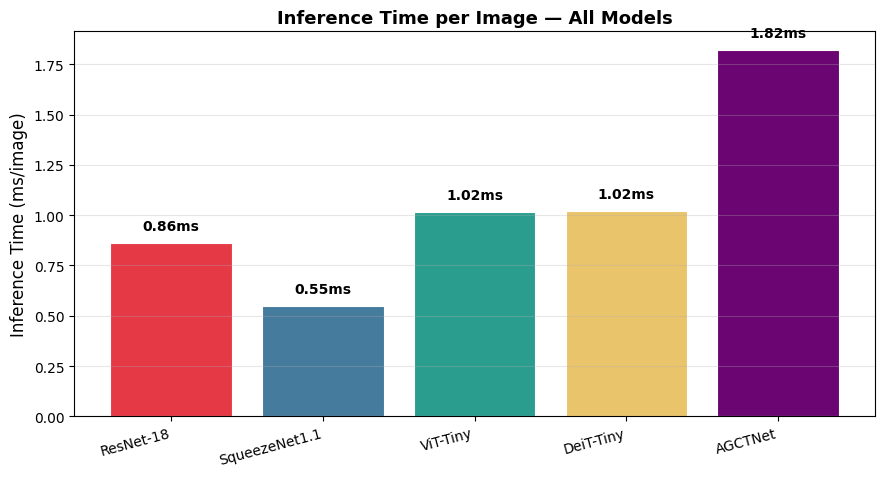

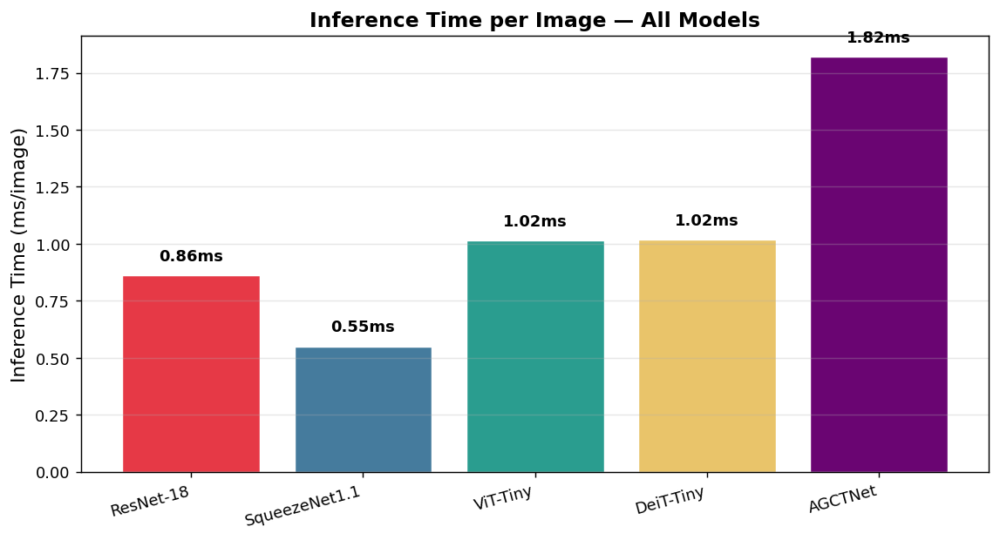

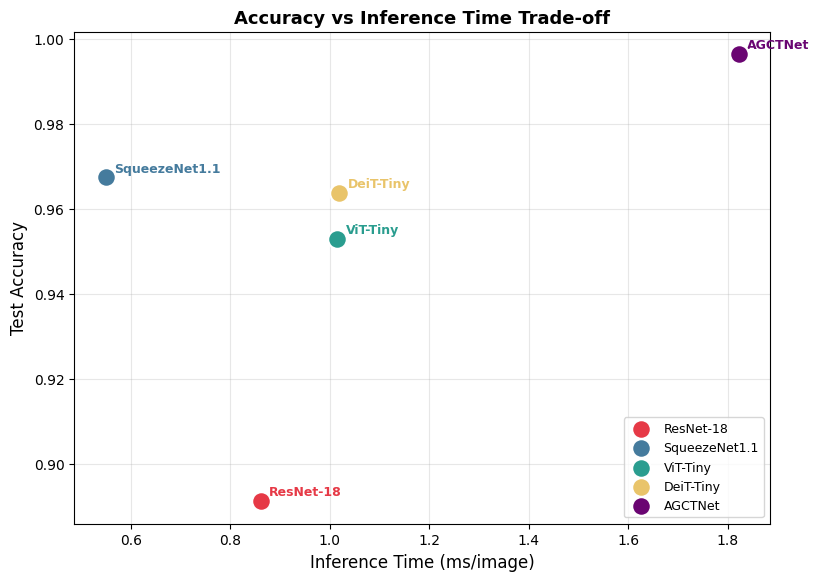

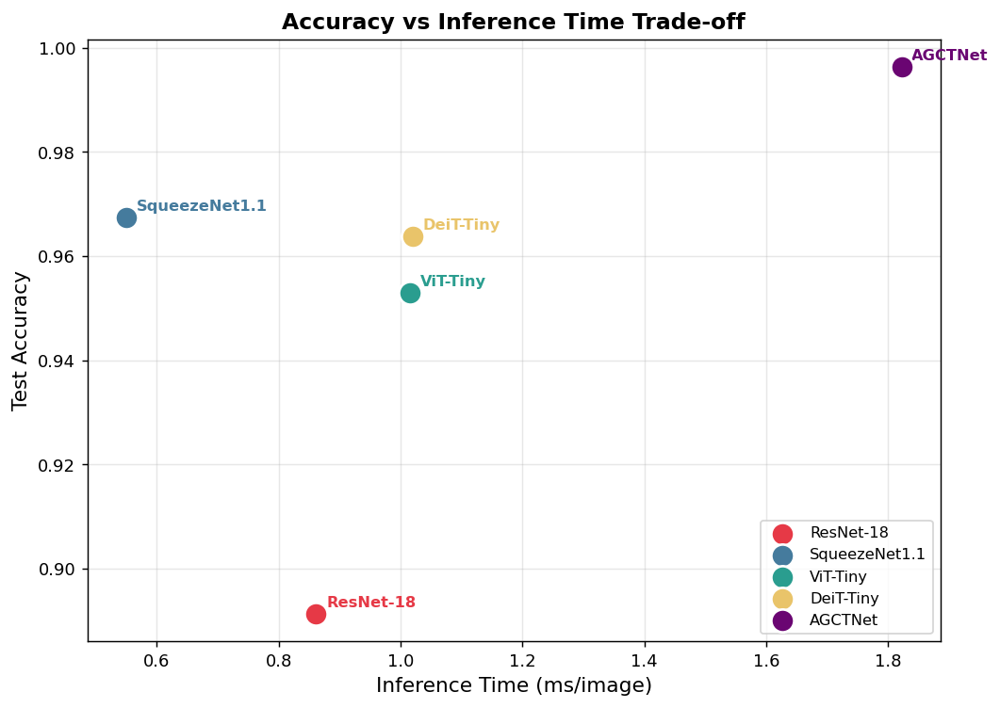

In [23]:
# ============================================================
# Block 15: Accuracy + Inference Time Bar Charts
# ============================================================

model_names = list(summary.keys())
tr_accs   = [summary[n]["train_acc"] for n in model_names]
va_accs   = [summary[n]["val_acc"]   for n in model_names]
te_accs   = [summary[n]["test_acc"]  for n in model_names]
infer_ms  = [summary[n]["infer_ms"]  for n in model_names]

bar_colors = ["#E63946","#457B9D","#2A9D8F","#E9C46A","#6A0572"]

# ── Figure 1: Grouped accuracy bar chart ──────────────────────
x     = np.arange(len(model_names))
width = 0.25

fig1, ax1 = plt.subplots(figsize=(12, 6), facecolor="white")
b1 = ax1.bar(x-width, tr_accs, width, label="Train",
              color="#457B9D", alpha=0.88)
b2 = ax1.bar(x,       va_accs, width, label="Validation",
              color="#2A9D8F", alpha=0.88)
b3 = ax1.bar(x+width, te_accs, width, label="Test",
              color="#E63946", alpha=0.88)

for bars in [b1, b2, b3]:
    for bar in bars:
        ax1.text(bar.get_x() + bar.get_width()/2,
                 bar.get_height() + 0.003,
                 f"{bar.get_height():.3f}",
                 ha="center", va="bottom",
                 fontsize=7, fontweight="bold")

ax1.set_xticks(x)
ax1.set_xticklabels(model_names, rotation=15,
                     ha="right", fontsize=10)
ax1.set_ylabel("Accuracy", fontsize=12)
ax1.set_ylim(min(tr_accs+va_accs+te_accs)-0.05, 1.02)
ax1.set_title("Train / Val / Test Accuracy — All Models",
               fontsize=13, fontweight="bold")
ax1.legend(fontsize=10)
ax1.grid(axis="y", alpha=0.3)

plt.subplots_adjust(left=0.08, right=0.97,
                    top=0.92, bottom=0.12)
save1 = "/kaggle/working/accuracy_comparison.png"
fig1.savefig(save1, dpi=130, bbox_inches="tight",
             facecolor="white")
ipy_display(fig1)
plt.close(fig1)
ipy_display(IPyImage(filename=save1, width=850))

# ── Figure 2: Test accuracy only ──────────────────────────────
fig2, ax2 = plt.subplots(figsize=(9, 5), facecolor="white")
bars2 = ax2.bar(model_names, te_accs, color=bar_colors,
                 edgecolor="white", linewidth=0.8)
for bar, acc in zip(bars2, te_accs):
    ax2.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 0.003,
             f"{acc:.4f}",
             ha="center", va="bottom",
             fontsize=10, fontweight="bold")
ax2.set_ylim(min(te_accs)-0.05, 1.02)
ax2.set_ylabel("Test Accuracy", fontsize=12)
ax2.set_title("Test Accuracy Comparison",
               fontsize=13, fontweight="bold")
ax2.set_xticklabels(model_names, rotation=15,
                     ha="right", fontsize=10)
ax2.grid(axis="y", alpha=0.3)
plt.subplots_adjust(left=0.08, right=0.97,
                    top=0.92, bottom=0.15)
save2 = "/kaggle/working/test_accuracy.png"
fig2.savefig(save2, dpi=130, bbox_inches="tight",
             facecolor="white")
ipy_display(fig2)
plt.close(fig2)
ipy_display(IPyImage(filename=save2, width=700))

# ── Figure 3: Inference time ───────────────────────────────────
fig3, ax3 = plt.subplots(figsize=(9, 5), facecolor="white")
bars3 = ax3.bar(model_names, infer_ms, color=bar_colors,
                 edgecolor="white", linewidth=0.8)
for bar, ms in zip(bars3, infer_ms):
    ax3.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 0.05,
             f"{ms:.2f}ms",
             ha="center", va="bottom",
             fontsize=10, fontweight="bold")
ax3.set_ylabel("Inference Time (ms/image)", fontsize=12)
ax3.set_title("Inference Time per Image — All Models",
               fontsize=13, fontweight="bold")
ax3.set_xticklabels(model_names, rotation=15,
                     ha="right", fontsize=10)
ax3.grid(axis="y", alpha=0.3)
plt.subplots_adjust(left=0.08, right=0.97,
                    top=0.92, bottom=0.15)
save3 = "/kaggle/working/inference_time.png"
fig3.savefig(save3, dpi=130, bbox_inches="tight",
             facecolor="white")
ipy_display(fig3)
plt.close(fig3)
ipy_display(IPyImage(filename=save3, width=700))

# ── Figure 4: Accuracy vs Inference scatter ───────────────────
fig4, ax4 = plt.subplots(figsize=(8, 6), facecolor="white")
for i, name in enumerate(model_names):
    ax4.scatter(infer_ms[i], te_accs[i],
                color=bar_colors[i], s=180, zorder=5,
                label=name, edgecolors="white", linewidths=1.5)
    ax4.annotate(name,
                 xy=(infer_ms[i], te_accs[i]),
                 xytext=(6, 4), textcoords="offset points",
                 fontsize=9, fontweight="bold",
                 color=bar_colors[i])

ax4.set_xlabel("Inference Time (ms/image)", fontsize=12)
ax4.set_ylabel("Test Accuracy", fontsize=12)
ax4.set_title("Accuracy vs Inference Time Trade-off",
               fontsize=13, fontweight="bold")
ax4.legend(fontsize=9, loc="lower right")
ax4.grid(alpha=0.3)
plt.subplots_adjust(left=0.10, right=0.97,
                    top=0.92, bottom=0.10)
save4 = "/kaggle/working/acc_vs_infer.png"
fig4.savefig(save4, dpi=130, bbox_inches="tight",
             facecolor="white")
ipy_display(fig4)
plt.close(fig4)
ipy_display(IPyImage(filename=save4, width=700))


ResNet-18  |  Test Acc: 0.8913  |  Inference: 0.86 ms/img
[[112  12   0   2]
 [  0  40   1   1]
 [  5   9  84   0]
 [  0   0   0  10]]


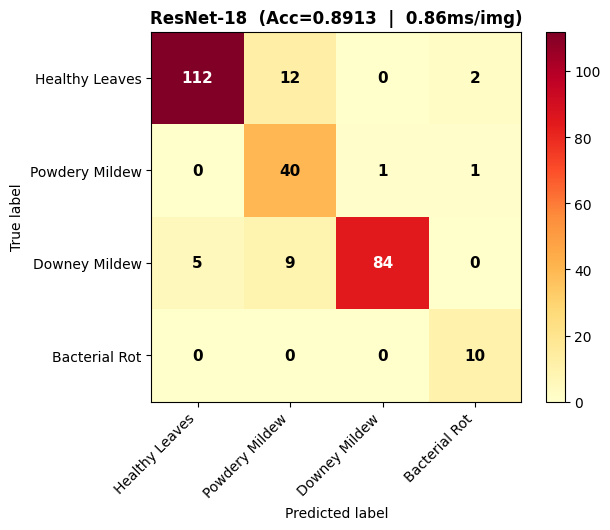

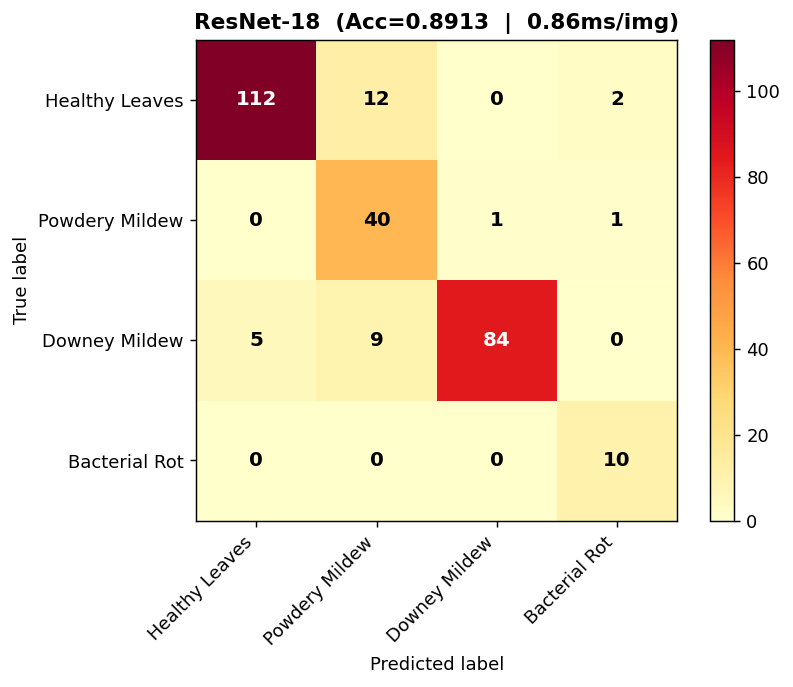


SqueezeNet1.1  |  Test Acc: 0.9674  |  Inference: 0.55 ms/img
[[121   3   2   0]
 [  0  40   1   1]
 [  2   0  96   0]
 [  0   0   0  10]]


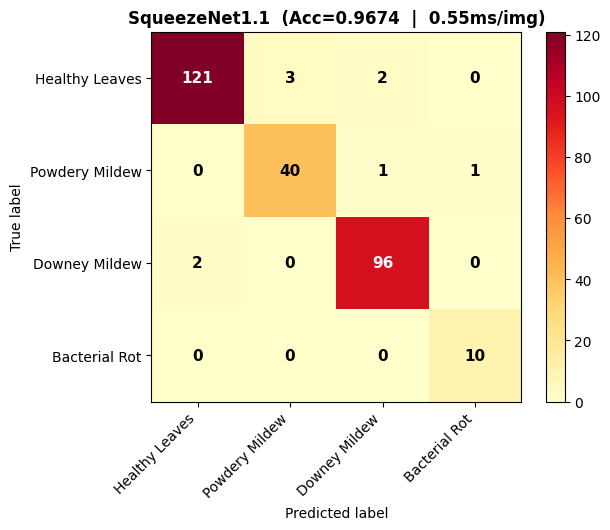

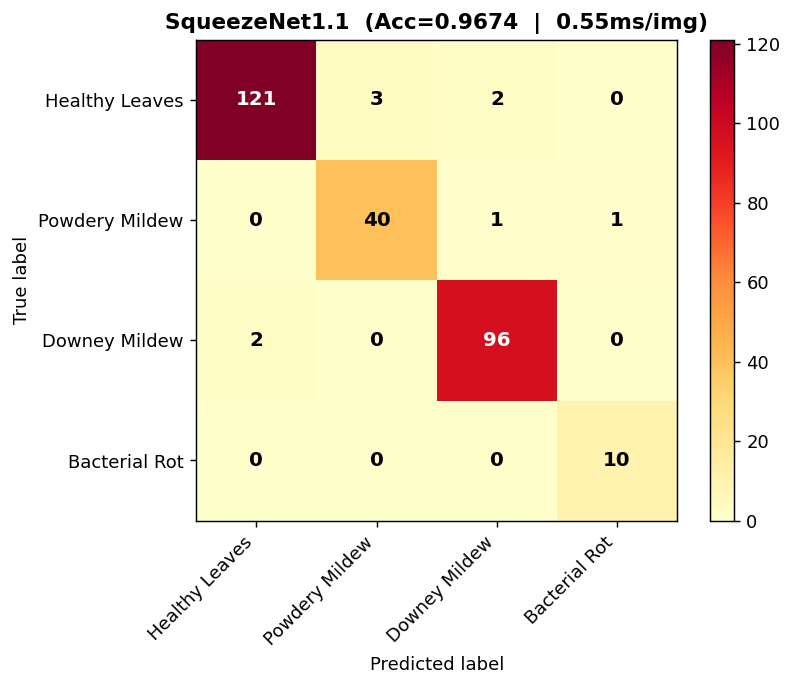


ViT-Tiny  |  Test Acc: 0.9529  |  Inference: 1.02 ms/img
[[123   2   1   0]
 [  0  39   2   1]
 [  3   3  92   0]
 [  0   0   1   9]]


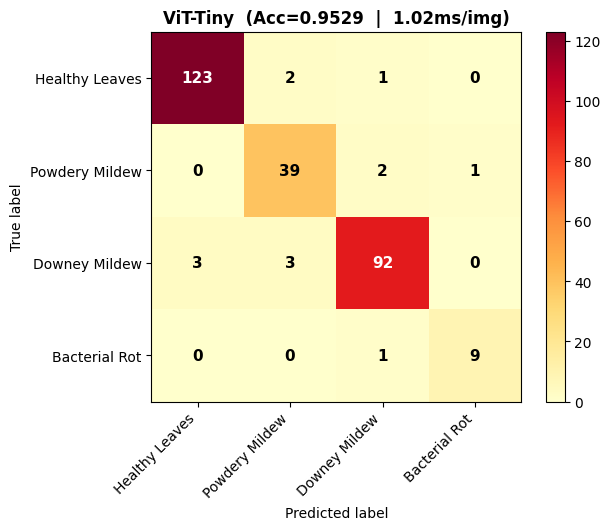

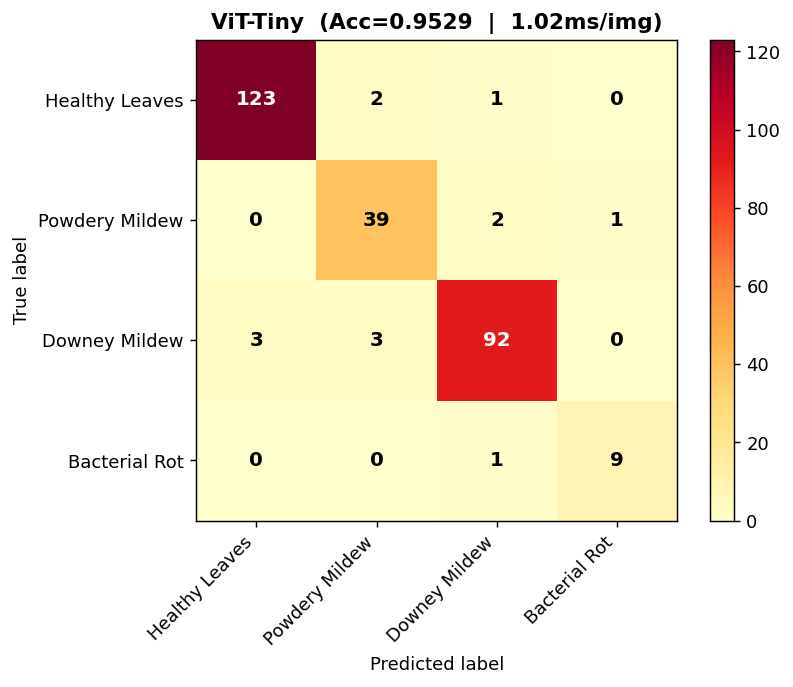


DeiT-Tiny  |  Test Acc: 0.9638  |  Inference: 1.02 ms/img
[[124   1   1   0]
 [  1  36   4   1]
 [  0   1  97   0]
 [  0   1   0   9]]


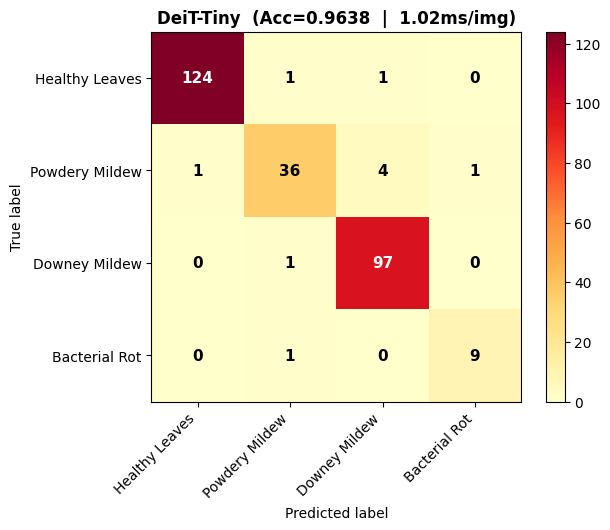

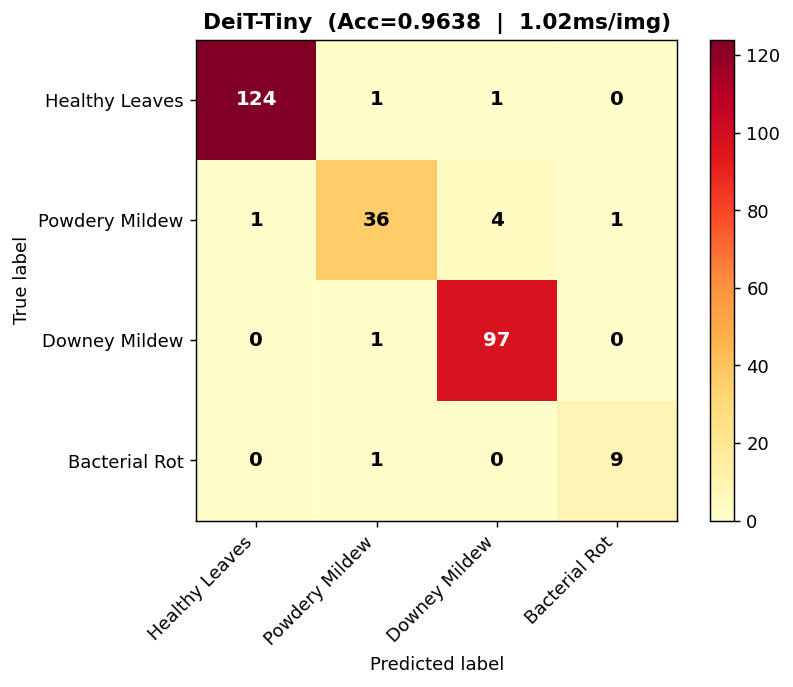


AGCTNet  |  Test Acc: 0.9964  |  Inference: 1.82 ms/img
[[126   0   0   0]
 [  0  41   0   1]
 [  0   0  98   0]
 [  0   0   0  10]]


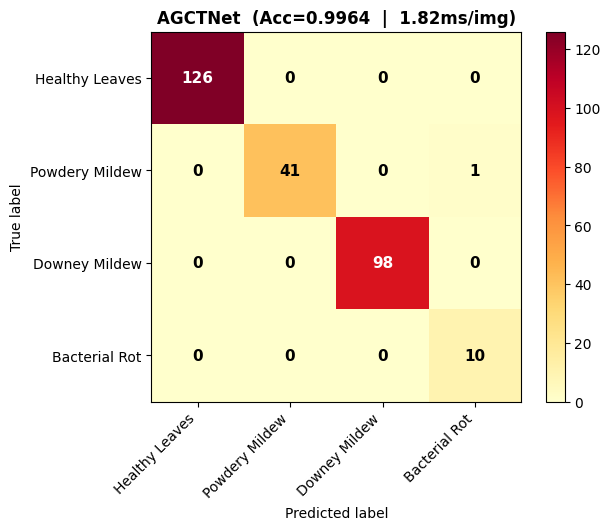

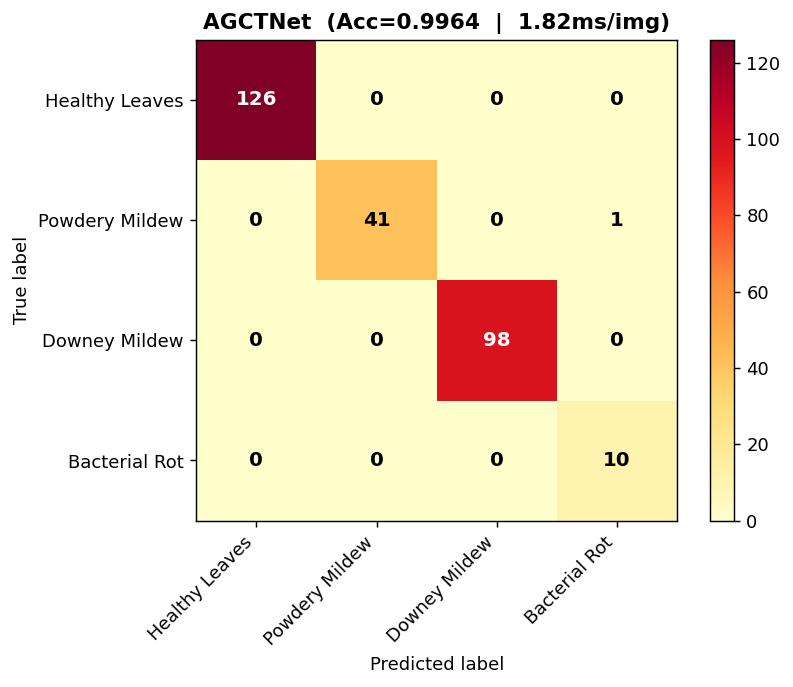

In [24]:
# ============================================================
# Block 16: Confusion Matrices — All Models
# ============================================================

def plot_cm(cm, class_names, title, save_path=None):
    fig, ax = plt.subplots(figsize=(6, 5), facecolor="white")
    im = ax.imshow(cm, interpolation="nearest", cmap="YlOrRd")
    plt.colorbar(im, ax=ax)
    ax.set_title(title, fontsize=12, fontweight="bold")
    ticks = np.arange(len(class_names))
    ax.set_xticks(ticks); ax.set_yticks(ticks)
    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)
    thresh = cm.max() / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, f"{cm[i,j]}",
                    ha="center", va="center", fontsize=11,
                    fontweight="bold",
                    color="white" if cm[i,j]>thresh else "black")
    ax.set_ylabel("True label")
    ax.set_xlabel("Predicted label")
    plt.subplots_adjust(left=0.15, right=0.98,
                        top=0.92, bottom=0.18)
    if save_path:
        fig.savefig(save_path, dpi=130, bbox_inches="tight",
                    facecolor="white")
    ipy_display(fig)
    plt.close(fig)
    if save_path:
        ipy_display(IPyImage(filename=save_path, width=500))


for name in model_names:
    yt = summary[name]["y_true_test"]
    yp = summary[name]["y_pred_test"]
    ms = summary[name]["infer_ms"]

    cm = confusion_matrix(yt, yp)
    print(f"\n{name}  |  Test Acc: {summary[name]['test_acc']:.4f}"
          f"  |  Inference: {ms:.2f} ms/img")
    print(cm)

    save_path = (f"/kaggle/working/cm_"
                 f"{name.replace('.','_').replace('-','_')}.png")
    plot_cm(cm, classes,
            title=f"{name}  (Acc={summary[name]['test_acc']:.4f}"
                  f"  |  {ms:.2f}ms/img)",
            save_path=save_path)

In [26]:
# ============================================================
# Block 17: Classification Reports — All Models
# ============================================================

import pandas as pd
from sklearn.metrics import classification_report

all_rows = []

for name in model_names:
    yt = summary[name]["y_true_test"]
    yp = summary[name]["y_pred_test"]
    ms = summary[name]["infer_ms"]

    print(f"\n{'='*60}")
    print(f"  {name}  |  Inference: {ms:.2f} ms/img")
    print(f"{'='*60}")
    print(classification_report(yt, yp,
                                target_names=classes,
                                zero_division=0))

    rd = classification_report(yt, yp,
                               target_names=classes,
                               output_dict=True,
                               zero_division=0)
    for cls in classes:
        row = rd.get(cls, {})
        all_rows.append({
            "Model":      name,
            "Class":      cls,
            "Precision":  round(row.get("precision", 0), 4),
            "Recall":     round(row.get("recall",    0), 4),
            "F1-score":   round(row.get("f1-score",  0), 4),
            "Support":    row.get("support", 0),
            "Infer_ms":   round(ms, 4),
        })

df_reports = pd.DataFrame(all_rows)
df_reports.to_csv("/kaggle/working/per_class_metrics.csv",
                  index=False)
print("\nSaved: per_class_metrics.csv")
print(df_reports.to_string(index=False))


  ResNet-18  |  Inference: 0.86 ms/img
                precision    recall  f1-score   support

Healthy Leaves       0.96      0.89      0.92       126
Powdery Mildew       0.66      0.95      0.78        42
 Downey Mildew       0.99      0.86      0.92        98
 Bacterial Rot       0.77      1.00      0.87        10

      accuracy                           0.89       276
     macro avg       0.84      0.92      0.87       276
  weighted avg       0.92      0.89      0.90       276


  SqueezeNet1.1  |  Inference: 0.55 ms/img
                precision    recall  f1-score   support

Healthy Leaves       0.98      0.96      0.97       126
Powdery Mildew       0.93      0.95      0.94        42
 Downey Mildew       0.97      0.98      0.97        98
 Bacterial Rot       0.91      1.00      0.95        10

      accuracy                           0.97       276
     macro avg       0.95      0.97      0.96       276
  weighted avg       0.97      0.97      0.97       276


  ViT-Tiny  |

In [27]:
# ============================================================
# Block 18: Advanced Metrics + Bootstrap CI + Inference Time
# ============================================================

def per_class_metrics(y_true, y_pred, class_names):
    cm  = confusion_matrix(y_true, y_pred)
    out = {}
    for i, cls in enumerate(class_names):
        TP = cm[i,i]
        FN = cm[i,:].sum() - TP
        FP = cm[:,i].sum() - TP
        TN = cm.sum() - TP - FP - FN
        out[cls] = {
            "Sensitivity": TP/(TP+FN+1e-8),
            "Specificity": TN/(TN+FP+1e-8),
            "PPV":         TP/(TP+FP+1e-8),
            "NPV":         TN/(TN+FN+1e-8),
        }
    return out, cm


def bootstrap_ci(y_true, y_pred, B=2000, conf=0.95, seed=42):
    rng  = np.random.default_rng(seed)
    n    = len(y_true)
    accs = []
    for _ in range(B):
        idx = rng.integers(0, n, n)
        accs.append(accuracy_score(y_true[idx], y_pred[idx]))
    lo = np.percentile(accs, (1-conf)/2*100)
    hi = np.percentile(accs, (1+conf)/2*100)
    return lo, hi


adv_rows = []

for name in model_names:
    yt = summary[name]["y_true_test"]
    yp = summary[name]["y_pred_test"]
    ms = summary[name]["infer_ms"]

    pcm, _  = per_class_metrics(yt, yp, classes)
    lo, hi  = bootstrap_ci(yt, yp)
    macro   = {k: np.mean([pcm[c][k] for c in classes])
               for k in ["Sensitivity","Specificity","PPV","NPV"]}

    print(f"\n{'='*55}")
    print(f"  {name}")
    print(f"  Test Acc    : {summary[name]['test_acc']:.4f}")
    print(f"  95% CI      : [{lo:.4f}, {hi:.4f}]")
    print(f"  Inference   : {ms:.2f} ms/image")
    for k, v in macro.items():
        print(f"  Macro {k:12s}: {v:.4f}")

    adv_rows.append({
        "Model":              name,
        "Test_Acc":           round(summary[name]["test_acc"],4),
        "CI_low":             round(lo,4),
        "CI_high":            round(hi,4),
        "Infer_ms":           round(ms,4),
        **{f"Macro_{k}": round(v,4) for k,v in macro.items()},
    })

df_adv = (pd.DataFrame(adv_rows)
          .sort_values("Test_Acc", ascending=False)
          .reset_index(drop=True))
df_adv.to_csv("/kaggle/working/advanced_metrics.csv", index=False)

print("\n\n=== Advanced Metrics Summary ===")
print(df_adv.to_string(index=False))
print("\nSaved: advanced_metrics.csv")


  ResNet-18
  Test Acc    : 0.8913
  95% CI      : [0.8551, 0.9275]
  Inference   : 0.86 ms/image
  Macro Sensitivity : 0.9246
  Macro Specificity : 0.9650
  Macro PPV         : 0.8426
  Macro NPV         : 0.9573

  SqueezeNet1.1
  Test Acc    : 0.9674
  95% CI      : [0.9457, 0.9855]
  Inference   : 0.55 ms/image
  Macro Sensitivity : 0.9731
  Macro Specificity : 0.9883
  Macro PPV         : 0.9482
  Macro NPV         : 0.9869

  ViT-Tiny
  Test Acc    : 0.9529
  95% CI      : [0.9275, 0.9746]
  Inference   : 1.02 ms/image
  Macro Sensitivity : 0.9359
  Macro Specificity : 0.9831
  Macro PPV         : 0.9302
  Macro NPV         : 0.9825

  DeiT-Tiny
  Test Acc    : 0.9638
  95% CI      : [0.9384, 0.9855]
  Inference   : 1.02 ms/image
  Macro Sensitivity : 0.9328
  Macro Specificity : 0.9872
  Macro PPV         : 0.9415
  Macro NPV         : 0.9880

  AGCTNet
  Test Acc    : 0.9964
  95% CI      : [0.9891, 1.0000]
  Inference   : 1.82 ms/image
  Macro Sensitivity : 0.9940
  Macro Spe

In [28]:
# ============================================================
# Block 19: McNemar Statistical Tests
# ============================================================

try:
    from statsmodels.stats.contingency_tables import mcnemar
except ImportError:
    import subprocess, sys
    subprocess.check_call([sys.executable,"-m","pip",
                           "install","statsmodels","-q"])
    from statsmodels.stats.contingency_tables import mcnemar


def run_mcnemar(y_true, pred_a, pred_b, name_a, name_b):
    b = sum(1 for yt,pa,pb in zip(y_true,pred_a,pred_b)
            if pa!=yt and pb==yt)
    c = sum(1 for yt,pa,pb in zip(y_true,pred_a,pred_b)
            if pa==yt and pb!=yt)
    result = mcnemar([[0,b],[c,0]], exact=(b+c)<25)
    sig    = ("✔ Significant (p<0.05)"
              if result.pvalue < 0.05
              else "✘ Not significant")
    print(f"  {name_a:<20} vs {name_b:<20} "
          f"b={b:3d}  c={c:3d}  "
          f"p={result.pvalue:.4f}  {sig}")
    return result.pvalue


y_true_ref   = summary["AGCTNet"]["y_true_test"]
y_pred_agct  = summary["AGCTNet"]["y_pred_test"]

print("=== McNemar: AGCTNet vs Each Baseline ===\n")
for name in model_names:
    if name == "AGCTNet":
        continue
    run_mcnemar(y_true_ref,
                summary[name]["y_pred_test"],
                y_pred_agct,
                name, "AGCTNet")

print("\n=== McNemar: CNN vs Transformer Pairwise ===\n")
run_mcnemar(y_true_ref,
            summary["ResNet-18"]["y_pred_test"],
            summary["ViT-Tiny"]["y_pred_test"],
            "ResNet-18", "ViT-Tiny")

run_mcnemar(y_true_ref,
            summary["SqueezeNet1.1"]["y_pred_test"],
            summary["DeiT-Tiny"]["y_pred_test"],
            "SqueezeNet1.1", "DeiT-Tiny")

=== McNemar: AGCTNet vs Each Baseline ===

  ResNet-18            vs AGCTNet              b= 29  c=  0  p=0.0000  ✔ Significant (p<0.05)
  SqueezeNet1.1        vs AGCTNet              b=  8  c=  0  p=0.0078  ✔ Significant (p<0.05)
  ViT-Tiny             vs AGCTNet              b= 12  c=  0  p=0.0005  ✔ Significant (p<0.05)
  DeiT-Tiny            vs AGCTNet              b=  9  c=  0  p=0.0039  ✔ Significant (p<0.05)

=== McNemar: CNN vs Transformer Pairwise ===

  ResNet-18            vs ViT-Tiny             b= 25  c=  8  p=0.0053  ✔ Significant (p<0.05)
  SqueezeNet1.1        vs DeiT-Tiny            b=  6  c=  7  p=1.0000  ✘ Not significant


np.float64(1.0)

In [30]:
# ============================================================
# Block 17: Advanced Clinical / Statistical Metrics
# Sensitivity, Specificity, PPV, NPV + Bootstrap 95% CI
# ============================================================

def per_class_metrics(y_true, y_pred, class_names):
    cm  = confusion_matrix(y_true, y_pred)
    out = {}
    for i, cls in enumerate(class_names):
        TP = cm[i, i]
        FN = cm[i, :].sum()  - TP
        FP = cm[:, i].sum()  - TP
        TN = cm.sum() - TP - FP - FN
        out[cls] = {
            "Sensitivity": TP / (TP + FN + 1e-8),
            "Specificity": TN / (TN + FP + 1e-8),
            "PPV":         TP / (TP + FP + 1e-8),
            "NPV":         TN / (TN + FN + 1e-8),
        }
    return out, cm


def bootstrap_ci(y_true, y_pred, B=2000, conf=0.95, seed=42):
    rng = np.random.default_rng(seed)
    n   = len(y_true)
    accs = [accuracy_score(y_true[idx := rng.integers(0, n, n)],
                           y_pred[idx])
            for _ in range(B)]
    lo = np.percentile(accs, (1 - conf) / 2 * 100)
    hi = np.percentile(accs, (1 + conf) / 2 * 100)
    return lo, hi


adv_rows = []

for name in model_names:
    yt = summary[name]["y_true_test"]
    yp = summary[name]["y_pred_test"]

    pcm, _  = per_class_metrics(yt, yp, classes)
    lo, hi  = bootstrap_ci(yt, yp)

    macro = {k: np.mean([pcm[c][k] for c in classes])
             for k in ["Sensitivity", "Specificity", "PPV", "NPV"]}

    print(f"\n{'='*50}")
    print(f"  {name}")
    print(f"  Test Acc : {summary[name]['test_acc']:.4f}")
    print(f"  95% CI   : [{lo:.4f}, {hi:.4f}]")
    for k, v in macro.items():
        print(f"  Macro {k:12s}: {v:.4f}")

    adv_rows.append({
        "Model":       name,
        "Test_Acc":    round(summary[name]["test_acc"], 4),
        "CI_low":      round(lo, 4),
        "CI_high":     round(hi, 4),
        **{f"Macro_{k}": round(v, 4) for k, v in macro.items()},
    })

df_adv = pd.DataFrame(adv_rows).sort_values("Test_Acc", ascending=False)
df_adv.to_csv("/kaggle/working/advanced_metrics.csv", index=False)
print("\n\n=== Advanced Metrics Summary ===")
print(df_adv.to_string(index=False))
print("\nSaved: advanced_metrics.csv")


  ResNet-18
  Test Acc : 0.8913
  95% CI   : [0.8551, 0.9275]
  Macro Sensitivity : 0.9246
  Macro Specificity : 0.9650
  Macro PPV         : 0.8426
  Macro NPV         : 0.9573

  SqueezeNet1.1
  Test Acc : 0.9674
  95% CI   : [0.9457, 0.9855]
  Macro Sensitivity : 0.9731
  Macro Specificity : 0.9883
  Macro PPV         : 0.9482
  Macro NPV         : 0.9869

  ViT-Tiny
  Test Acc : 0.9529
  95% CI   : [0.9275, 0.9746]
  Macro Sensitivity : 0.9359
  Macro Specificity : 0.9831
  Macro PPV         : 0.9302
  Macro NPV         : 0.9825

  DeiT-Tiny
  Test Acc : 0.9638
  95% CI   : [0.9384, 0.9855]
  Macro Sensitivity : 0.9328
  Macro Specificity : 0.9872
  Macro PPV         : 0.9415
  Macro NPV         : 0.9880

  AGCTNet
  Test Acc : 0.9964
  95% CI   : [0.9891, 1.0000]
  Macro Sensitivity : 0.9940
  Macro Specificity : 0.9991
  Macro PPV         : 0.9773
  Macro NPV         : 0.9989


=== Advanced Metrics Summary ===
        Model  Test_Acc  CI_low  CI_high  Macro_Sensitivity  Macro_Sp

Samples: ['Healthy Leaves', 'Powdery Mildew', 'Downey Mildew', 'Bacterial Rot']

  CAM None for ResNet-18
  CAM None for ResNet-18
  CAM None for ResNet-18
  CAM None for ResNet-18
ERROR SqueezeNet1.1: Output 0 of BackwardHookFunctionBackward is a view and is being modified inplace. This view was created inside a custom Function (or because an input was returned as-is) and the autograd logic to handle view+inplace would override the custom backward associated with the custom Function, leading to incorrect gradients. This behavior is forbidden. You can fix this by cloning the output of the custom Function.


Traceback (most recent call last):
  File "/tmp/ipykernel_58/3419004124.py", line 126, in <cell line: 0>
    show_gradcam(fpath, gcam, val_test_tf,
  File "/tmp/ipykernel_58/3419004124.py", line 65, in show_gradcam
    cam, pred_idx = gcam(img_t)
                    ^^^^^^^^^^^
  File "/tmp/ipykernel_58/3419004124.py", line 21, in __call__
    out = self.model(x)
          ^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py", line 1776, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py", line 1787, in _call_impl
    return forward_call(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torchvision/models/squeezenet.py", line 95, in forward
    x = self.features(x)
        ^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py"

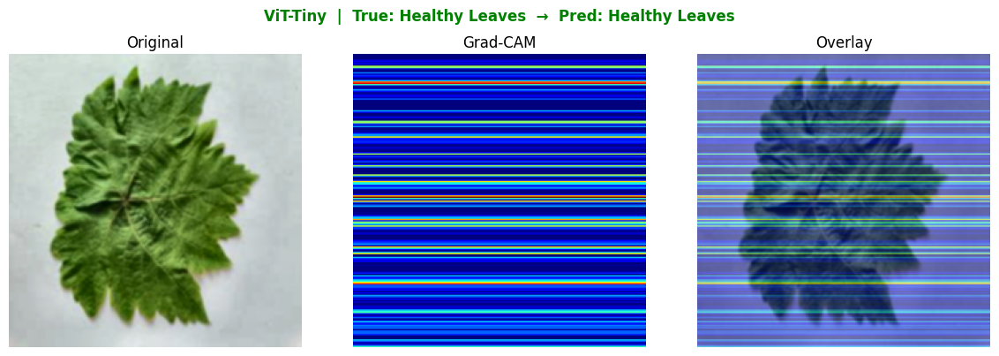

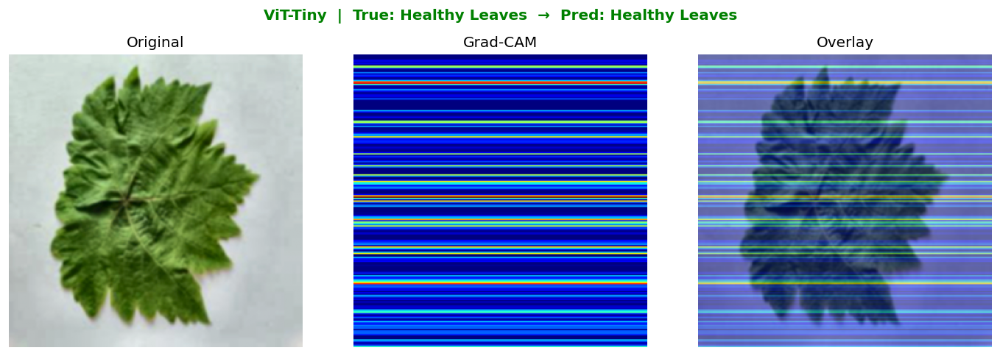

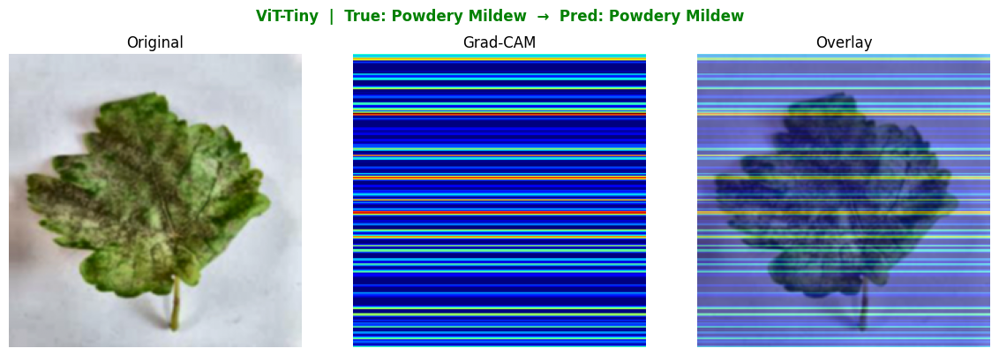

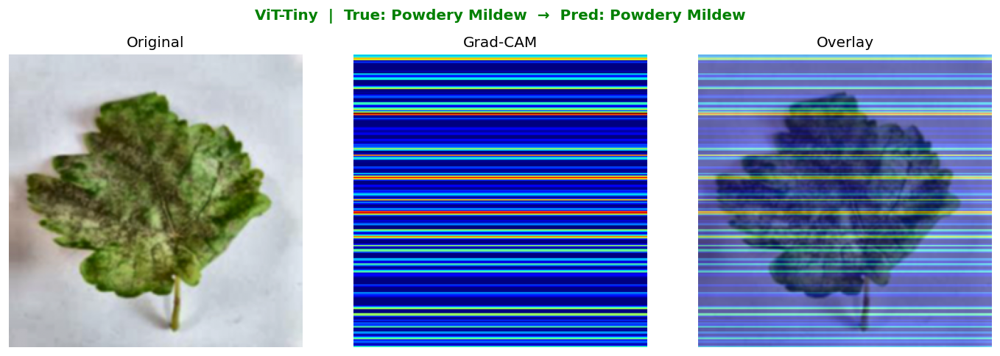

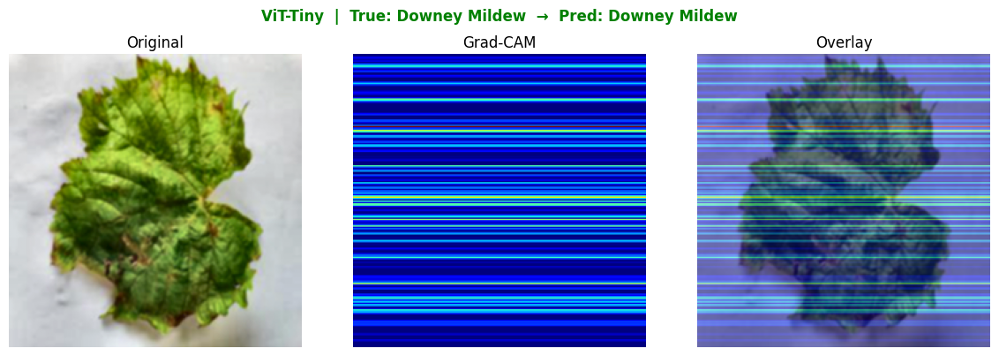

...

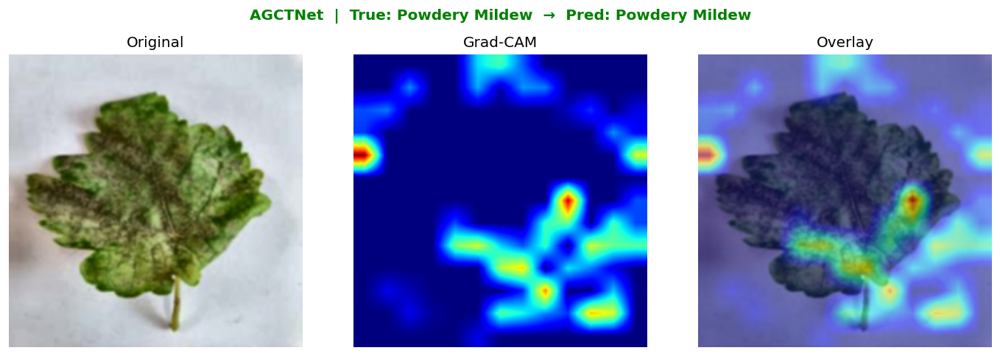

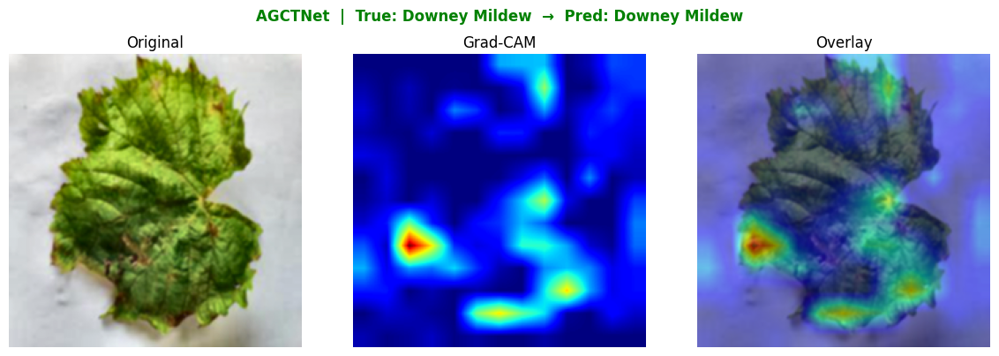

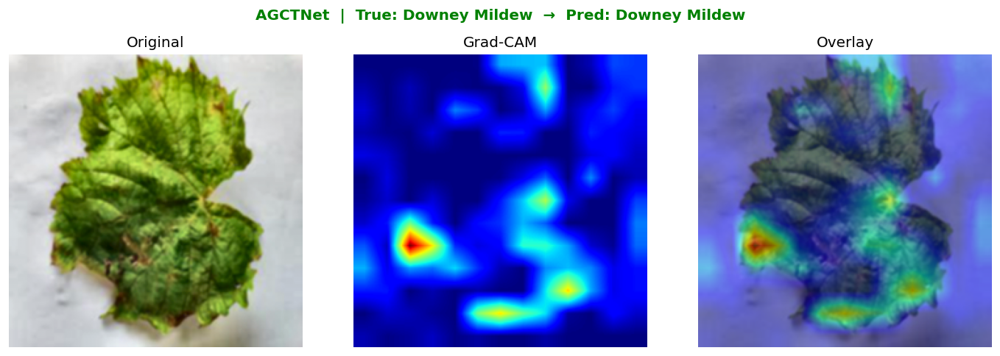

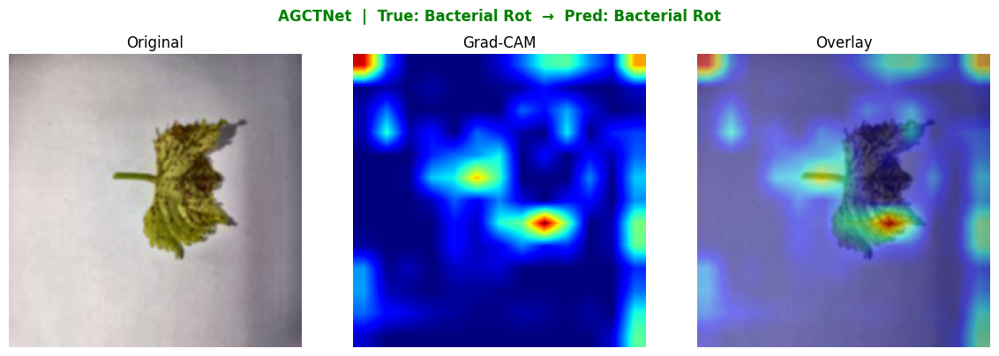

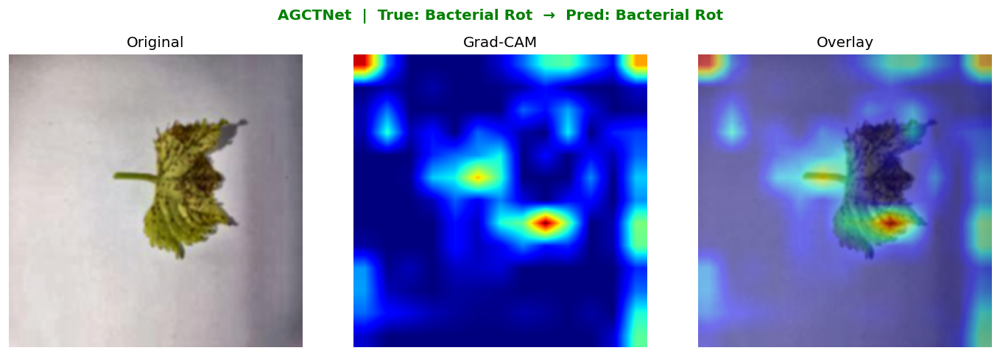

In [31]:
# ============================================================
# Block 20: Grad-CAM — All Models
# ============================================================

import cv2

class GradCAM:
    def __init__(self, model, target_layer):
        self.model       = model
        self.activations = None
        self.gradients   = None
        self._fwd = target_layer.register_forward_hook(
            lambda m,i,o: setattr(self,"activations",o.detach()))
        self._bwd = target_layer.register_full_backward_hook(
            lambda m,gi,go: setattr(self,"gradients",
                                    go[0].detach()))

    def __call__(self, x, class_idx=None):
        self.model.zero_grad()
        self.model.eval()
        out = self.model(x)
        if class_idx is None:
            class_idx = out.argmax(1).item()
        out[0, class_idx].backward()

        grads = self.gradients
        acts  = self.activations
        if grads is None or acts is None:
            return None, class_idx

        if grads.dim() == 3:
            grads = grads.unsqueeze(-1)
            acts  = acts.unsqueeze(-1)

        weights = grads.mean(dim=(2,3))[0]
        cam     = (weights[:,None,None] * acts[0]).sum(0)
        cam     = F.relu(cam)
        cam     = cam - cam.min()
        cam     = cam / (cam.max() + 1e-8)
        return cam.cpu().numpy(), class_idx

    def remove(self):
        self._fwd.remove()
        self._bwd.remove()


def get_gradcam_layer(name, mdl):
    if name == "ResNet-18":
        return mdl.layer4[-1].conv2
    elif name == "SqueezeNet1.1":
        return mdl.features[-1].expand3x3
    elif name == "ViT-Tiny":
        return list(mdl.blocks)[-1].norm1
    elif name == "DeiT-Tiny":
        return list(mdl.blocks)[-1].norm1
    elif name == "AGCTNet":
        return mdl.cnn_branch[-1]
    return None


def show_gradcam(img_path, gcam, transform,
                 true_lbl, model_name, save_path=None):
    orig    = Image.open(img_path).convert("RGB")
    img_t   = transform(orig).unsqueeze(0).to(device)
    cam, pred_idx = gcam(img_t)
    if cam is None:
        print(f"  CAM None for {model_name}")
        return
    pred_cls = classes[pred_idx]
    orig_np  = np.array(orig.resize((224,224))) / 255.0
    cam_r    = cv2.resize(cam, (224,224))
    heatmap  = plt.cm.jet(cam_r)[...,:3]
    overlay  = np.clip(0.5*orig_np + 0.5*heatmap, 0, 1)

    fig, axes = plt.subplots(1, 3, figsize=(12,4),
                              facecolor="white")
    title_color = "green" if true_lbl==pred_cls else "red"
    fig.suptitle(
        f"{model_name}  |  True: {true_lbl}  "
        f"→  Pred: {pred_cls}",
        fontsize=12, fontweight="bold", color=title_color)

    axes[0].imshow(orig_np)
    axes[0].set_title("Original")
    axes[1].imshow(cam_r, cmap="jet")
    axes[1].set_title("Grad-CAM")
    axes[2].imshow(overlay)
    axes[2].set_title("Overlay")
    for ax in axes:
        ax.axis("off")

    plt.subplots_adjust(wspace=0.05, left=0.02,
                        right=0.98, top=0.85, bottom=0.02)
    if save_path:
        fig.savefig(save_path, dpi=120, bbox_inches="tight",
                    facecolor="white")
    ipy_display(fig)
    plt.close(fig)
    if save_path:
        ipy_display(IPyImage(filename=save_path, width=800))


# one image per class
sample_per_class = {}
for fpath, lbl_idx in test_ds.samples:
    cls_name = classes[lbl_idx]
    if cls_name not in sample_per_class:
        sample_per_class[cls_name] = (fpath, lbl_idx)
    if len(sample_per_class) == len(classes):
        break

print(f"Samples: {list(sample_per_class.keys())}\n")

for mname, mdl in model_registry.items():
    layer = get_gradcam_layer(mname, mdl)
    if layer is None:
        print(f"No layer for {mname}, skipping.")
        continue
    try:
        gcam = GradCAM(mdl, layer)
        for cls_name, (fpath, lbl_idx) in \
                sample_per_class.items():
            sp = (f"/kaggle/working/gradcam_"
                  f"{mname.replace('.','_').replace('-','_')}"
                  f"_{cls_name}.png")
            show_gradcam(fpath, gcam, val_test_tf,
                         cls_name, mname, save_path=sp)
        gcam.remove()
    except Exception as e:
        print(f"ERROR {mname}: {e}")
        import traceback; traceback.print_exc()

/tmp/ipykernel_58/584252007.py:41: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.transformer = nn.TransformerEncoder(enc, n_layers)
/tmp/ipykernel_58/584252007.py:85: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.transformer = nn.TransformerEncoder(enc, n_layers)
/tmp/ipykernel_58/584252007.py:137: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.transformer = nn.TransformerEncoder(enc, n_layers)
/tmp/ipykernel_58/3654718673.py:92: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.transformer = nn.TransformerEncoder(enc, n_layers)


Running Ablation Study (25 epochs each)…


───────────────────────────────────────────────────────
  A: CNN Branch Only
───────────────────────────────────────────────────────

  Training: abl_A
Ep 01/25  tr_loss=0.5227  tr_acc=0.5750  |  va_loss=0.1502  va_acc=0.8856
           ✔ Saved best weights  (val_loss=0.1502)
Ep 02/25  tr_loss=0.1900  tr_acc=0.8587  |  va_loss=0.1907  va_acc=0.8376
Ep 03/25  tr_loss=0.1240  tr_acc=0.9045  |  va_loss=0.0399  va_acc=0.9594
           ✔ Saved best weights  (val_loss=0.0399)
Ep 04/25  tr_loss=0.0897  tr_acc=0.9183  |  va_loss=0.0961  va_acc=0.9004
Ep 05/25  tr_loss=0.0830  tr_acc=0.9339  |  va_loss=0.2200  va_acc=0.8635
Ep 06/25  tr_loss=0.0795  tr_acc=0.9339  |  va_loss=0.0541  va_acc=0.9520
Ep 07/25  tr_loss=0.0646  tr_acc=0.9440  |  va_loss=0.0404  va_acc=0.9705
Ep 08/25  tr_loss=0.0555  tr_acc=0.9518  |  va_loss=0.0128  va_acc=0.9852
           ✔ Saved best weights  (val_loss=0.0128)
Ep 09/25  tr_loss=0.0551  tr_acc=0.9541  |  va_loss=0.0689  

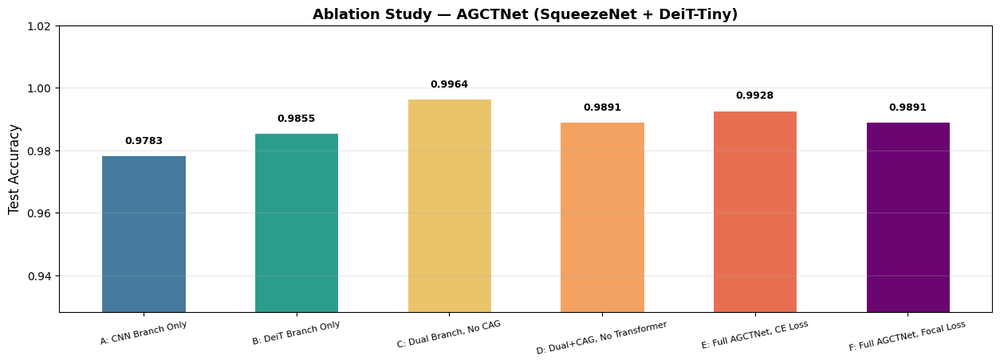

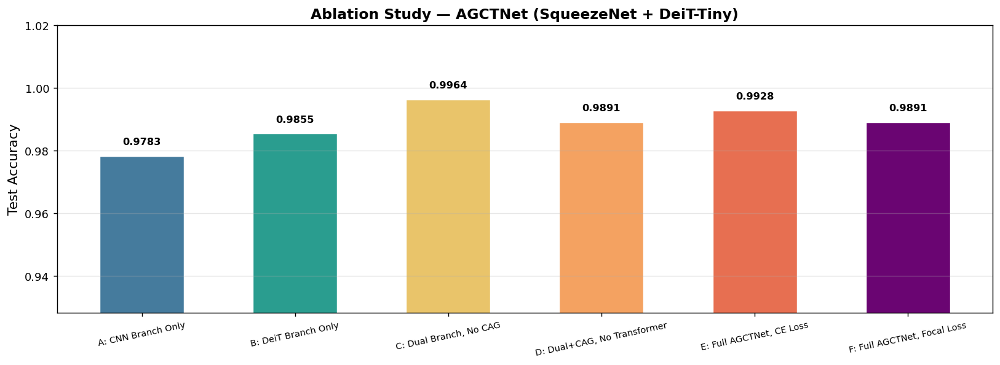

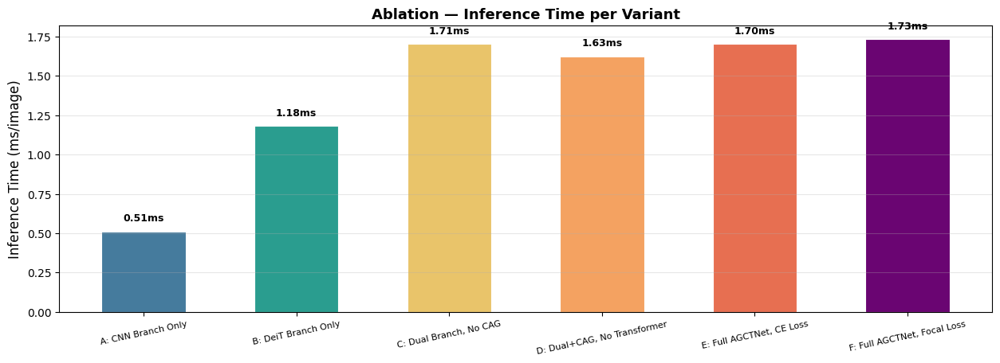

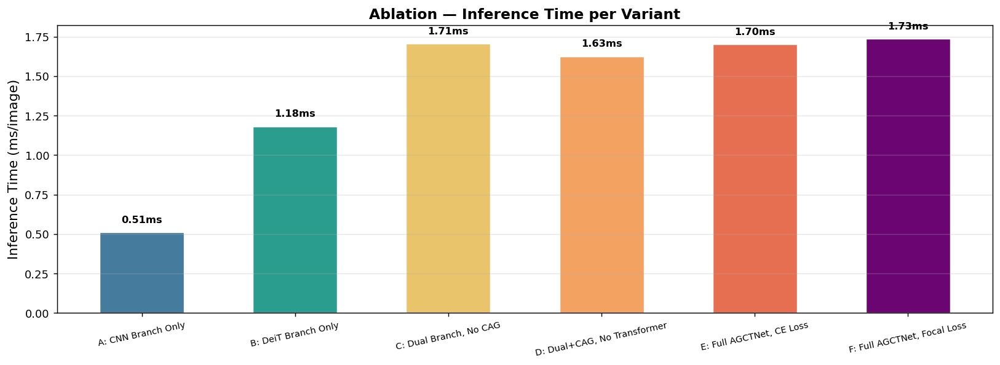

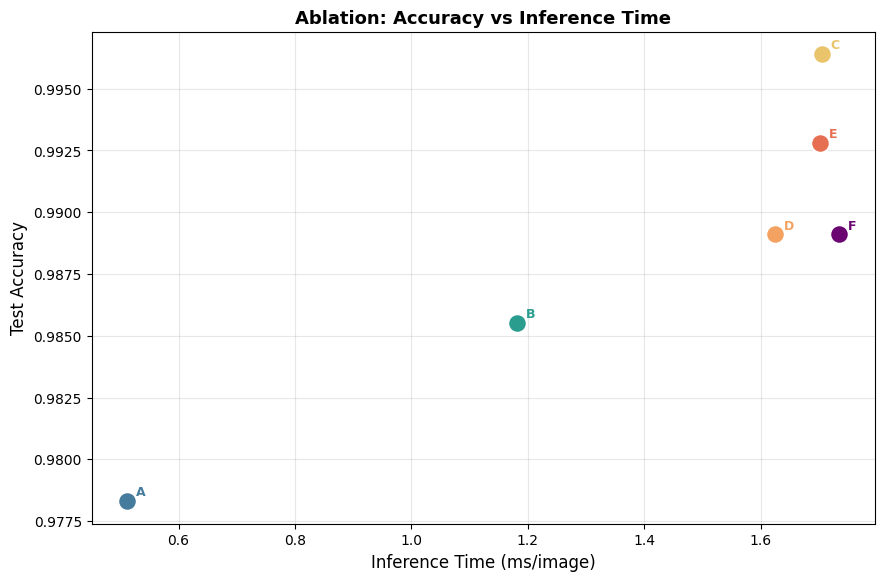

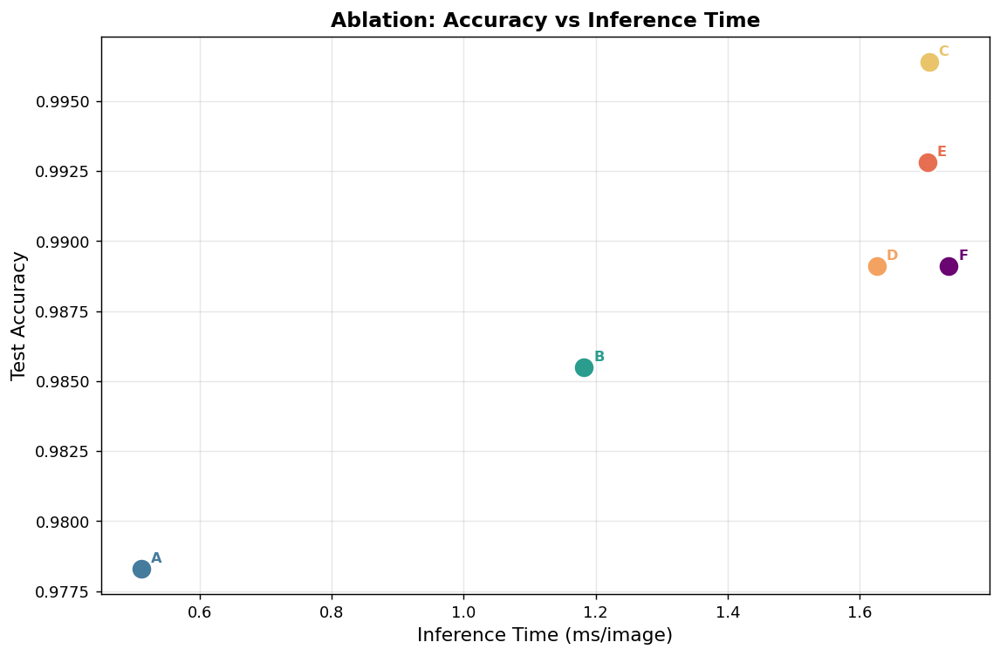


Saved: ablation_accuracy.png
Saved: ablation_inference.png
Saved: ablation_scatter.png
Saved: ablation_results.csv


In [32]:
# ============================================================
# Block 12b (Updated): Ablation Study
# Dual-Branch: SqueezeNet1.1 + DeiT-Tiny (both fully trainable)
#
# A: CNN Branch Only    (SqueezeNet + Transformer, no DeiT)
# B: DeiT Branch Only   (DeiT + Transformer, no SqueezeNet)
# C: Dual Branch, No CAG
# D: Dual Branch + CAG, No Transformer
# E: Full AGCTNet, CE Loss
# F: Full AGCTNet, Focal Loss  ← proposed
# ============================================================

import timm
from torchvision.models import squeezenet1_1, SqueezeNet1_1_Weights


# ── Variant A: CNN Branch Only ────────────────────────────────
class Ablation_CNNOnly(nn.Module):
    """SqueezeNet features + Transformer, no DeiT branch"""
    def __init__(self, num_classes=4, d_model=256,
                 n_heads=8, n_layers=3, dropout=0.3):
        super().__init__()
        sq = squeezenet1_1(
            weights=SqueezeNet1_1_Weights.IMAGENET1K_V1)
        self.cnn_branch = sq.features
        self.cnn_align  = nn.AdaptiveAvgPool2d((7,7))

        self.fuse_proj  = nn.Sequential(
            nn.Conv2d(512, d_model*2, 1, bias=False),
            nn.BatchNorm2d(d_model*2), nn.GELU())
        self.patch_proj = nn.Conv2d(d_model*2, d_model, 1)
        self.cls_token  = nn.Parameter(torch.zeros(1,1,d_model))
        self.pos_embed  = nn.Parameter(torch.zeros(1,50,d_model))
        nn.init.trunc_normal_(self.cls_token, std=0.02)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)

        enc = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=n_heads,
            dim_feedforward=d_model*4, dropout=dropout,
            batch_first=True, norm_first=True)
        self.transformer = nn.TransformerEncoder(enc, n_layers)
        self.norm = nn.LayerNorm(d_model)
        self.head = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(d_model, num_classes))

    def forward(self, x):
        B     = x.size(0)
        f     = self.cnn_align(self.cnn_branch(x))  # (B,512,7,7)
        fused = self.fuse_proj(f)                    # (B,512,7,7)
        tok   = self.patch_proj(fused)\
                    .flatten(2).permute(0,2,1)       # (B,49,256)
        cls   = self.cls_token.expand(B,-1,-1)
        tok   = torch.cat([cls,tok],1) + self.pos_embed
        return self.head(self.norm(
            self.transformer(tok)[:,0]))


# ── Variant B: DeiT Branch Only ───────────────────────────────
class Ablation_DeiTOnly(nn.Module):
    """DeiT-Tiny CLS token + Transformer, no SqueezeNet branch"""
    def __init__(self, num_classes=4, d_model=256,
                 n_heads=8, n_layers=3, dropout=0.3):
        super().__init__()
        deit = timm.create_model(
            "deit_tiny_patch16_224",
            pretrained=True, num_classes=0)
        self.deit_branch  = deit
        self.deit_spatial = nn.Sequential(
            nn.Linear(192, 192*49, bias=False), nn.GELU())

        self.fuse_proj  = nn.Sequential(
            nn.Conv2d(192, d_model*2, 1, bias=False),
            nn.BatchNorm2d(d_model*2), nn.GELU())
        self.patch_proj = nn.Conv2d(d_model*2, d_model, 1)
        self.cls_token  = nn.Parameter(torch.zeros(1,1,d_model))
        self.pos_embed  = nn.Parameter(torch.zeros(1,50,d_model))
        nn.init.trunc_normal_(self.cls_token, std=0.02)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)

        enc = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=n_heads,
            dim_feedforward=d_model*4, dropout=dropout,
            batch_first=True, norm_first=True)
        self.transformer = nn.TransformerEncoder(enc, n_layers)
        self.norm = nn.LayerNorm(d_model)
        self.head = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(d_model, num_classes))

    def forward(self, x):
        B      = x.size(0)
        cls_t  = self.deit_branch(x)               # (B,192)
        f_deit = self.deit_spatial(cls_t)\
                     .view(B,192,7,7)              # (B,192,7,7)
        fused  = self.fuse_proj(f_deit)            # (B,512,7,7)
        tok    = self.patch_proj(fused)\
                     .flatten(2).permute(0,2,1)    # (B,49,256)
        cls    = self.cls_token.expand(B,-1,-1)
        tok    = torch.cat([cls,tok],1) + self.pos_embed
        return self.head(self.norm(
            self.transformer(tok)[:,0]))


# ── Variant C: Dual Branch, No CAG ───────────────────────────
class Ablation_NoCAG(nn.Module):
    """Both branches fused, NO Channel Attention Gate"""
    def __init__(self, num_classes=4, d_model=256,
                 n_heads=8, n_layers=3, dropout=0.3):
        super().__init__()
        sq = squeezenet1_1(
            weights=SqueezeNet1_1_Weights.IMAGENET1K_V1)
        self.cnn_branch   = sq.features
        self.cnn_align    = nn.AdaptiveAvgPool2d((7,7))

        deit = timm.create_model(
            "deit_tiny_patch16_224",
            pretrained=True, num_classes=0)
        self.deit_branch  = deit
        self.deit_spatial = nn.Sequential(
            nn.Linear(192, 192*49, bias=False), nn.GELU())

        # no CAG — direct projection after concat
        self.fuse_proj  = nn.Sequential(
            nn.Conv2d(704, d_model*2, 1, bias=False),
            nn.BatchNorm2d(d_model*2), nn.GELU())
        self.patch_proj = nn.Conv2d(d_model*2, d_model, 1)
        self.cls_token  = nn.Parameter(torch.zeros(1,1,d_model))
        self.pos_embed  = nn.Parameter(torch.zeros(1,50,d_model))
        nn.init.trunc_normal_(self.cls_token, std=0.02)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)

        enc = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=n_heads,
            dim_feedforward=d_model*4, dropout=dropout,
            batch_first=True, norm_first=True)
        self.transformer = nn.TransformerEncoder(enc, n_layers)
        self.norm = nn.LayerNorm(d_model)
        self.head = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(d_model, num_classes))

    def forward(self, x):
        B      = x.size(0)
        f_cnn  = self.cnn_align(self.cnn_branch(x))  # (B,512,7,7)
        cls_t  = self.deit_branch(x)
        f_deit = self.deit_spatial(cls_t).view(B,192,7,7)
        fused  = self.fuse_proj(
            torch.cat([f_cnn,f_deit],1))              # (B,512,7,7)
        tok    = self.patch_proj(fused)\
                     .flatten(2).permute(0,2,1)
        cls    = self.cls_token.expand(B,-1,-1)
        tok    = torch.cat([cls,tok],1) + self.pos_embed
        return self.head(self.norm(
            self.transformer(tok)[:,0]))


# ── Variant D: Dual Branch + CAG, No Transformer ─────────────
class Ablation_NoTransformer(nn.Module):
    """Both branches + CAG, NO final Transformer encoder"""
    def __init__(self, num_classes=4, dropout=0.3):
        super().__init__()
        sq = squeezenet1_1(
            weights=SqueezeNet1_1_Weights.IMAGENET1K_V1)
        self.cnn_branch   = sq.features
        self.cnn_align    = nn.AdaptiveAvgPool2d((7,7))

        deit = timm.create_model(
            "deit_tiny_patch16_224",
            pretrained=True, num_classes=0)
        self.deit_branch  = deit
        self.deit_spatial = nn.Sequential(
            nn.Linear(192, 192*49, bias=False), nn.GELU())

        self.fuse_proj = nn.Sequential(
            nn.Conv2d(704, 512, 1, bias=False),
            nn.BatchNorm2d(512), nn.GELU())
        self.cag  = ChannelAttentionGate(512, reduction=16)
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.head = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(512, num_classes))

    def forward(self, x):
        B      = x.size(0)
        f_cnn  = self.cnn_align(self.cnn_branch(x))
        cls_t  = self.deit_branch(x)
        f_deit = self.deit_spatial(cls_t).view(B,192,7,7)
        fused  = self.cag(
            self.fuse_proj(
                torch.cat([f_cnn,f_deit],1)))
        return self.head(self.pool(fused).flatten(1))


# ============================================================
# Run Ablation
# ============================================================

CE_criterion = nn.CrossEntropyLoss(label_smoothing=0.05)

ablation_configs = [
    ("A: CNN Branch Only",
     Ablation_CNNOnly(num_classes).to(device),       criterion),
    ("B: DeiT Branch Only",
     Ablation_DeiTOnly(num_classes).to(device),      criterion),
    ("C: Dual Branch, No CAG",
     Ablation_NoCAG(num_classes).to(device),         criterion),
    ("D: Dual+CAG, No Transformer",
     Ablation_NoTransformer(num_classes).to(device), criterion),
    ("E: Full AGCTNet, CE Loss",
     AGCTNet(num_classes).to(device),                CE_criterion),
    ("F: Full AGCTNet, Focal Loss",
     AGCTNet(num_classes).to(device),                criterion),
]

ablation_results  = {}
ablation_infer_ms = {}

print("Running Ablation Study (25 epochs each)…\n")

for variant, mdl, crit in ablation_configs:
    print(f"\n{'─'*55}")
    print(f"  {variant}")
    print(f"{'─'*55}")

    safe = variant[0]    # A / B / C / D / E / F
    mdl, _ = train_model(
        mdl, f"abl_{safe}",
        train_loader, val_loader, crit,
        num_epochs=25, patience=6, lr=5e-5,
    )

    # accuracy + inference time
    yt, yp, ms = get_preds_with_time(mdl, test_loader, device)
    acc = accuracy_score(yt, yp)

    ablation_results[variant]  = round(acc, 4)
    ablation_infer_ms[variant] = round(ms,  4)

    print(f"  Acc: {acc:.4f}   Inference: {ms:.2f} ms/img")

# ── Summary table ─────────────────────────────────────────────
print("\n" + "="*62)
print(f"  {'Variant':<35} {'Acc':>7}  {'ms/img':>8}")
print("="*62)
for k in ablation_results:
    flag = "  ← PROPOSED" if k.startswith("F") else ""
    print(f"  {k:<35} "
          f"{ablation_results[k]:>7.4f}  "
          f"{ablation_infer_ms[k]:>7.2f}ms"
          f"{flag}")
print("="*62)

# ── Bar chart: accuracy ───────────────────────────────────────
from IPython.display import display as ipy_display, Image as IPyImage

names  = list(ablation_results.keys())
accs   = list(ablation_results.values())
ms_vals= list(ablation_infer_ms.values())
colors = ["#457B9D","#2A9D8F","#E9C46A",
          "#F4A261","#E76F51","#6A0572"]

fig1, ax1 = plt.subplots(figsize=(13,5), facecolor="white")
bars = ax1.bar(names, accs, color=colors,
               edgecolor="white", linewidth=0.8, width=0.55)
for bar, acc in zip(bars, accs):
    ax1.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 0.003,
             f"{acc:.4f}", ha="center", va="bottom",
             fontsize=9, fontweight="bold")
ax1.set_ylim(min(accs)-0.05, 1.02)
ax1.set_ylabel("Test Accuracy", fontsize=12)
ax1.set_title(
    "Ablation Study — AGCTNet (SqueezeNet + DeiT-Tiny)",
    fontsize=13, fontweight="bold")
ax1.tick_params(axis="x", labelsize=8, rotation=12)
ax1.grid(axis="y", alpha=0.3)
plt.subplots_adjust(left=0.07, right=0.97,
                    top=0.90, bottom=0.18)
save1 = "/kaggle/working/ablation_accuracy.png"
fig1.savefig(save1, dpi=130, bbox_inches="tight",
             facecolor="white")
ipy_display(fig1)
plt.close(fig1)
ipy_display(IPyImage(filename=save1, width=900))

# ── Bar chart: inference time ─────────────────────────────────
fig2, ax2 = plt.subplots(figsize=(13,5), facecolor="white")
bars2 = ax2.bar(names, ms_vals, color=colors,
                edgecolor="white", linewidth=0.8, width=0.55)
for bar, ms in zip(bars2, ms_vals):
    ax2.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 0.05,
             f"{ms:.2f}ms", ha="center", va="bottom",
             fontsize=9, fontweight="bold")
ax2.set_ylabel("Inference Time (ms/image)", fontsize=12)
ax2.set_title(
    "Ablation — Inference Time per Variant",
    fontsize=13, fontweight="bold")
ax2.tick_params(axis="x", labelsize=8, rotation=12)
ax2.grid(axis="y", alpha=0.3)
plt.subplots_adjust(left=0.07, right=0.97,
                    top=0.90, bottom=0.18)
save2 = "/kaggle/working/ablation_inference.png"
fig2.savefig(save2, dpi=130, bbox_inches="tight",
             facecolor="white")
ipy_display(fig2)
plt.close(fig2)
ipy_display(IPyImage(filename=save2, width=900))

# ── Combined scatter: acc vs inference ────────────────────────
fig3, ax3 = plt.subplots(figsize=(9,6), facecolor="white")
for i, name in enumerate(names):
    ax3.scatter(ms_vals[i], accs[i],
                color=colors[i], s=180, zorder=5,
                edgecolors="white", linewidths=1.5)
    ax3.annotate(name.split(":")[0],
                 xy=(ms_vals[i], accs[i]),
                 xytext=(6,4), textcoords="offset points",
                 fontsize=9, fontweight="bold",
                 color=colors[i])
ax3.set_xlabel("Inference Time (ms/image)", fontsize=12)
ax3.set_ylabel("Test Accuracy", fontsize=12)
ax3.set_title("Ablation: Accuracy vs Inference Time",
              fontsize=13, fontweight="bold")
ax3.grid(alpha=0.3)
plt.subplots_adjust(left=0.10, right=0.97,
                    top=0.92, bottom=0.10)
save3 = "/kaggle/working/ablation_scatter.png"
fig3.savefig(save3, dpi=130, bbox_inches="tight",
             facecolor="white")
ipy_display(fig3)
plt.close(fig3)
ipy_display(IPyImage(filename=save3, width=700))

# ── Save CSV ──────────────────────────────────────────────────
import pandas as pd
pd.DataFrame([{
    "Variant":  k,
    "Test_Acc": ablation_results[k],
    "Infer_ms": ablation_infer_ms[k],
} for k in names]).to_csv(
    "/kaggle/working/ablation_results.csv", index=False)

print("\nSaved: ablation_accuracy.png")
print("Saved: ablation_inference.png")
print("Saved: ablation_scatter.png")
print("Saved: ablation_results.csv")

In [33]:
# ============================================================
# Block 21: 5-Fold Cross-Validation — AGCTNet (Proposed Model)
# Validates generalizability; not done in prior NGLD papers.
# ============================================================

from sklearn.model_selection import StratifiedKFold
from torch.utils.data import Subset

# Full preprocessed dataset (no split)
full_ds = GrapeDataset(PREPROC_DIR, val_test_tf)

all_labels  = [lbl for _, lbl in full_ds.samples]
skf         = StratifiedKFold(n_splits=5, shuffle=True, random_state=SEED)
fold_accs   = []

print("5-Fold Cross-Validation on AGCTNet\n")

for fold, (train_idx, val_idx) in enumerate(
        skf.split(np.zeros(len(all_labels)), all_labels), start=1):

    tr_sub = Subset(full_ds, train_idx)
    va_sub = Subset(full_ds, val_idx)

    # Weighted sampler for fold train set
    fold_labels  = [all_labels[i] for i in train_idx]
    fold_counts  = [fold_labels.count(c) for c in range(num_classes)]
    fold_weights = [1.0 / fold_counts[l] for l in fold_labels]
    fold_sampler = WeightedRandomSampler(fold_weights,
                                         len(fold_labels), replacement=True)

    tr_ld = DataLoader(tr_sub, batch_size=BATCH, sampler=fold_sampler,
                       num_workers=2, pin_memory=True)
    va_ld = DataLoader(va_sub, batch_size=BATCH, shuffle=False,
                       num_workers=2, pin_memory=True)

    mdl_fold = AGCTNet(num_classes).to(device)
    mdl_fold, _ = train_model(
        mdl_fold, f"cv_fold{fold}",
        tr_ld, va_ld, criterion,
        num_epochs=20, patience=5, lr=2e-4
    )

    _, acc = evaluate(mdl_fold, va_ld, criterion, device)
    fold_accs.append(acc)
    print(f"  Fold {fold}: {acc:.4f}")
    del mdl_fold

print(f"\nMean Acc : {np.mean(fold_accs):.4f}")
print(f"Std  Dev : {np.std(fold_accs):.4f}")

np.save("/kaggle/working/cv_fold_accuracies.npy", np.array(fold_accs))
print("Saved: cv_fold_accuracies.npy")

5-Fold Cross-Validation on AGCTNet


  Training: cv_fold1


/tmp/ipykernel_58/3654718673.py:92: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.transformer = nn.TransformerEncoder(enc, n_layers)


Ep 01/20  tr_loss=0.2138  tr_acc=0.8408  |  va_loss=0.3851  va_acc=0.7143
           ✔ Saved best weights  (val_loss=0.3851)
Ep 02/20  tr_loss=0.0638  tr_acc=0.9518  |  va_loss=0.1253  va_acc=0.9158
           ✔ Saved best weights  (val_loss=0.1253)
Ep 03/20  tr_loss=0.0543  tr_acc=0.9583  |  va_loss=0.2620  va_acc=0.8352
Ep 04/20  tr_loss=0.0299  tr_acc=0.9725  |  va_loss=0.1133  va_acc=0.9322
           ✔ Saved best weights  (val_loss=0.1133)
Ep 05/20  tr_loss=0.0339  tr_acc=0.9720  |  va_loss=0.0487  va_acc=0.9670
           ✔ Saved best weights  (val_loss=0.0487)
Ep 06/20  tr_loss=0.0186  tr_acc=0.9858  |  va_loss=0.0904  va_acc=0.9542
Ep 07/20  tr_loss=0.0164  tr_acc=0.9849  |  va_loss=0.0558  va_acc=0.9597
Ep 08/20  tr_loss=0.0203  tr_acc=0.9821  |  va_loss=0.0687  va_acc=0.9542
Ep 09/20  tr_loss=0.0117  tr_acc=0.9908  |  va_loss=0.0842  va_acc=0.9396
Ep 10/20  tr_loss=0.0070  tr_acc=0.9950  |  va_loss=0.0284  va_acc=0.9780
           ✔ Saved best weights  (val_loss=0.0284)
Ep 11

In [34]:
# ============================================================
# Block 21: Save All Outputs for Notebook 2
# ============================================================

import json

model_names_list = list(summary.keys())

# ── 1. predictions & labels ───────────────────────────────────
for name in model_names_list:
    safe = name.replace("-","_").replace(".","_").replace(" ","_")
    np.save(f"/kaggle/working/{safe}_y_true.npy",
            summary[name]["y_true_test"])
    np.save(f"/kaggle/working/{safe}_y_pred.npy",
            summary[name]["y_pred_test"])

# ── 2. full accuracy + inference table ────────────────────────
acc_rows = []
for n in model_names_list:
    acc_rows.append({
        "Model":      n,
        "Train_Acc":  round(summary[n]["train_acc"],  4),
        "Val_Acc":    round(summary[n]["val_acc"],    4),
        "Test_Acc":   round(summary[n]["test_acc"],   4),
        "Infer_ms":   round(summary[n]["infer_ms"],   4),
        "Params_M":   round(
            sum(p.numel() for p in model_registry[n].parameters())
            / 1e6, 2),
    })

df_acc = pd.DataFrame(acc_rows)
df_acc.to_csv("/kaggle/working/accuracy_table.csv", index=False)

# ── 3. ablation ───────────────────────────────────────────────
pd.DataFrame([{"Variant":k,"Test_Acc":v}
               for k,v in ablation_results.items()]
             ).to_csv("/kaggle/working/ablation_results.csv",
                      index=False)

# ── 4. weight file map ────────────────────────────────────────
weight_map = {
    "ResNet-18":     "best_resnet18.pth",
    "SqueezeNet1.1": "best_squeezenet.pth",
    "ViT-Tiny":      "best_vit_tiny.pth",
    "DeiT-Tiny":     "best_deit_tiny.pth",
    "AGCTNet":       "best_agctnet.pth",
}
with open("/kaggle/working/weight_files.json","w") as f:
    json.dump(weight_map, f, indent=2)

# ── 5. classes ────────────────────────────────────────────────
with open("/kaggle/working/classes.json","w") as f:
    json.dump(classes, f)

# ── 6. cv fold accuracies ─────────────────────────────────────
if "fold_accs" in dir():
    np.save("/kaggle/working/cv_fold_accuracies.npy",
            np.array(fold_accs))

# ── 7. print full summary table ───────────────────────────────
print("\n" + "="*70)
print("  FINAL SUMMARY TABLE")
print("="*70)
print(df_acc.to_string(index=False))

print("\n" + "="*70)
print("  FILES SAVED")
print("="*70)
for fname in sorted(os.listdir("/kaggle/working/")):
    if fname.endswith((".png",".csv",".pth",".npy",".json")):
        kb = os.path.getsize(f"/kaggle/working/{fname}")/1024
        print(f"  {fname:50s} {kb:8.1f} KB")


  FINAL SUMMARY TABLE
        Model  Train_Acc  Val_Acc  Test_Acc  Infer_ms  Params_M
    ResNet-18     0.8669   0.9373    0.8913    0.8612     11.24
SqueezeNet1.1     0.9472   0.9705    0.9674    0.5500      0.72
     ViT-Tiny     0.9495   0.9779    0.9529    1.0154      5.53
    DeiT-Tiny     0.9738   0.9852    0.9638    1.0195      5.53
      AGCTNet     0.9995   1.0000    0.9964    1.8219     10.96

  FILES SAVED
  AGCTNet_y_pred.npy                                      2.3 KB
  AGCTNet_y_true.npy                                      2.3 KB
  DeiT_Tiny_y_pred.npy                                    2.3 KB
  DeiT_Tiny_y_true.npy                                    2.3 KB
  ResNet_18_y_pred.npy                                    2.3 KB
  ResNet_18_y_true.npy                                    2.3 KB
  SqueezeNet1_1_y_pred.npy                                2.3 KB
  SqueezeNet1_1_y_true.npy                                2.3 KB
  ViT_Tiny_y_pred.npy                                     